# **Model Interpretability**

# Abstract:
This is a loan dataset prediciting if loan can be granted or rejected based on some features

# Aim: 
In this assignment we aim to interpret the results of 
- Linear Model
- Tree Based Model
- Best model of AutoML H2O
 
Using different Model Interpretibility Methods.
 
Following methods are used for model interpretability
- SHAP analysis
- LIME analysis

#Variable Description
1.  **perc_premium_paid_by_cash_credit**: Percentage of premium amount paid by cash or credit card
2.  **age_in_days**: Age in days of policy holder
3.  **Income**: Monthly Income of policy holder
4.  **Count_3-6_months_late**: No of premiums late by 3 to 6 months
5.  **Count_6-12_months_late**: No of premiums late by 6 to 12 months
6.  **Count_more_than_12_months_late**: No of premiums late by more than 12 months
7.  **application_underwriting_score**: Underwriting Score of the applicant at the time of application (No applications under the score of 90 are insured)
8.  **no_of_premiums_paid**: Total premiums paid on time till now
9.  **sourcing_channel**: Sourcing channel for application
10. **residence_area_type**: Area type of Residence (Urban/Rural)
11. **target**: 1 - premium paid on time, 0 - otherwise


In [90]:
#Installing dependencies

!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [91]:
# Importing all libraries necessary for the assignment

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Importing Scikit-Learn library to fill missing values
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

# Importing libraries to form the train and test data
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import train_test_split

# Importing libraries to fit various models
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingClassifier

# Importing libraries to perform AutoML using h2o

import warnings
warnings.filterwarnings('ignore')
import h2o
from h2o.automl import H2OAutoML

# Importing libraries to compute the metrics like MAE
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import accuracy_score

# Importing libraries for SHAP analysis
import shap
from sklearn.feature_extraction.text import TfidfVectorizer
from lime import lime_tabular

# For plots
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.image as mpimg

# Importing supporting libraries
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil

plt.rcParams["figure.figsize"] = (32, 24)

In [92]:
# Setting up maximum runtime for the AutoML

min_mem_size = 6
run_time = 222

In [93]:
# Setting up memory

pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

2


In [94]:
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)


try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:52571..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpcfmofdm5
  JVM stdout: /tmp/tmpcfmofdm5/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpcfmofdm5/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:52571
Connecting to H2O server at http://127.0.0.1:52571 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_ysef9a
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
# loading the dataset from github by Reading CSV file into Pandas DataFrame

loan_df = pd.read_csv('https://raw.githubusercontent.com/charmiparmar/INFO6105_DSEMT/main/dataset.csv',index_col=0)

In [ ]:
# viewing the shape of imported dataset to ensure dataset is loaded properly

loan_df.shape

(79853, 12)

In [ ]:
# glimpse of sample values of the imported dataset 

loan_df.head()

,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,target
id,,,,,,,,,,,,
110936,0.429,12058,355060,0.0,0.0,0.0,99.02,13,C,Urban,3300,1
41492,0.010,21546,315150,0.0,0.0,0.0,99.89,21,A,Urban,18000,1
31300,0.917,17531,84140,2.0,3.0,1.0,98.69,7,C,Rural,3300,0
19415,0.049,15341,250510,0.0,0.0,0.0,99.57,9,A,Urban,9600,1
99379,0.052,31400,198680,0.0,0.0,0.0,99.87,12,B,Urban,9600,1


In [95]:
# checking the count of rows in each column and datatype of each column present in dataset

loan_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 76855 entries, 110936 to 71531
Data columns (total 12 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   perc_premium_paid_by_cash_credit  76855 non-null  float64
 1   age_in_days                       76855 non-null  int64  
 2   Income                            76855 non-null  int64  
 3   Count_3-6_months_late             76855 non-null  float64
 4   Count_6-12_months_late            76855 non-null  float64
 5   Count_more_than_12_months_late    76855 non-null  float64
 6   application_underwriting_score    76855 non-null  float64
 7   no_of_premiums_paid               76855 non-null  int64  
 8   sourcing_channel                  76855 non-null  int64  
 9   residence_area_type               76855 non-null  int64  
 10  premium                           76855 non-null  int64  
 11  target                            76855 non-null  int64  
dtyp

In [96]:
# checking unique values of categorical values

loan_df.sourcing_channel.unique()

array([2, 0, 1, 3, 4])

In [97]:
loan_df.residence_area_type.unique()

array([1, 0])

In [98]:
# describing the kind of data present in the dataset

loan_df.describe()

,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,target
count,76855.000000,76855.000000,7.685500e+04,76855.000000,76855.000000,76855.000000,76855.000000,76855.000000,76855.000000,76855.000000,76855.000000,76855.000000
mean,0.314777,18801.935983,2.088393e+05,0.254388,0.076937,0.061154,99.067053,11.054505,0.838566,0.602797,11007.937024,0.937805
std,0.330002,5102.226406,3.697466e+05,0.699544,0.430994,0.315304,0.739789,5.106978,1.057006,0.489322,9419.183801,0.241511
min,0.000000,7670.000000,2.403000e+04,0.000000,0.000000,0.000000,91.900000,2.000000,0.000000,0.000000,1200.000000,0.000000
25%,0.038000,14975.000000,1.098050e+05,0.000000,0.000000,0.000000,98.810000,7.000000,0.000000,0.000000,5400.000000,1.000000
50%,0.174000,18624.000000,1.683300e+05,0.000000,0.000000,0.000000,99.210000,10.000000,0.000000,1.000000,7500.000000,1.000000
75%,0.534500,22280.000000,2.543950e+05,0.000000,0.000000,0.000000,99.540000,14.000000,2.000000,1.000000,13800.000000,1.000000
max,1.000000,37240.000000,5.382190e+07,13.000000,17.000000,11.000000,99.890000,59.000000,4.000000,1.000000,60000.000000,1.000000


The varying count in each column shows that there are observations with no missing values.

The mean represents the average value of each column.

The standard deviation (std) shows how much the values in each column vary from the mean.

The min and max values are the smallest and largest values in each column, respectively.

The 25%, 50%, and 75% quartiles represent the values below which 25%, 50%, and 75% of the values in each column fall, respectively.

The range of the dataset can be seen by subtracting the min value from the max value.

In [99]:
# checking if any missing values are present in the dataset

loan_df.isnull().sum()

perc_premium_paid_by_cash_credit    0
age_in_days                         0
Income                              0
Count_3-6_months_late               0
Count_6-12_months_late              0
Count_more_than_12_months_late      0
application_underwriting_score      0
no_of_premiums_paid                 0
sourcing_channel                    0
residence_area_type                 0
premium                             0
target                              0
dtype: int64

In [100]:
# imputing null values with mean value

loan_df = loan_df.dropna(axis=0, how='any', subset=None, inplace=False)

In [101]:
# Ensuring there are no missing values are present in the dataset

loan_df.isnull().sum()

perc_premium_paid_by_cash_credit    0
age_in_days                         0
Income                              0
Count_3-6_months_late               0
Count_6-12_months_late              0
Count_more_than_12_months_late      0
application_underwriting_score      0
no_of_premiums_paid                 0
sourcing_channel                    0
residence_area_type                 0
premium                             0
target                              0
dtype: int64

In [102]:
# describing the kind of data present in the dataset

loan_df.describe()

,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,target
count,76855.000000,76855.000000,7.685500e+04,76855.000000,76855.000000,76855.000000,76855.000000,76855.000000,76855.000000,76855.000000,76855.000000,76855.000000
mean,0.314777,18801.935983,2.088393e+05,0.254388,0.076937,0.061154,99.067053,11.054505,0.838566,0.602797,11007.937024,0.937805
std,0.330002,5102.226406,3.697466e+05,0.699544,0.430994,0.315304,0.739789,5.106978,1.057006,0.489322,9419.183801,0.241511
min,0.000000,7670.000000,2.403000e+04,0.000000,0.000000,0.000000,91.900000,2.000000,0.000000,0.000000,1200.000000,0.000000
25%,0.038000,14975.000000,1.098050e+05,0.000000,0.000000,0.000000,98.810000,7.000000,0.000000,0.000000,5400.000000,1.000000
50%,0.174000,18624.000000,1.683300e+05,0.000000,0.000000,0.000000,99.210000,10.000000,0.000000,1.000000,7500.000000,1.000000
75%,0.534500,22280.000000,2.543950e+05,0.000000,0.000000,0.000000,99.540000,14.000000,2.000000,1.000000,13800.000000,1.000000
max,1.000000,37240.000000,5.382190e+07,13.000000,17.000000,11.000000,99.890000,59.000000,4.000000,1.000000,60000.000000,1.000000


We can see now all the columns have same count value since null values are removed

In [103]:
#Converting categorical columns to numerical for computation purpose

encoder = LabelEncoder()
loan_df['sourcing_channel'] = encoder.fit_transform(loan_df['sourcing_channel'])
loan_df['residence_area_type'] = encoder.fit_transform(loan_df['residence_area_type'])

In [104]:
# Training Feature
X = loan_df.drop(["target"], axis=1)  

# Target
y = loan_df["target"]  

In [105]:
# Splitting Data into Training and Test
(x_train, x_test, y_train, y_test,) = train_test_split( X, y, test_size=0.1, random_state=42)

# Taking 1000 samples out for SHAP analysis as it is a computationally expensive process
x_train_1000 = shap.utils.sample(x_train, 1000)  

# Taking 1000 samples out for SHAP analysis as it is a computationally expensive process
x_test_1000 = shap.utils.sample(x_test, 1000)  

In [106]:
# splitting X and y variables into train and test data
print("---------------Shape of Train dataset after splitting---------------")
print("X_train: ", x_train.shape)
print("y_train: ", y_train.shape)
print("---------------Shape of Test dataset after splitting---------------")
print("X_test: ", x_test.shape)
print("y_test: ", y_test.shape)

---------------Shape of Train dataset after splitting---------------
X_train:  (69169, 11)
y_train:  (69169,)
---------------Shape of Test dataset after splitting---------------
X_test:  (7686, 11)
y_test:  (7686,)


# Fitting a Linear Model

In [107]:
# Initializing a Linear Model
linear_model = LinearRegression()  

# Training a linear model
linear_model.fit(x_train, y_train)  

LinearRegression()

In [108]:
# Scaling the data using Min-Max scaling for the purpose of evaluating Co-efficients, as non scaled data may mislead while we evaluate the co-efficients
df = loan_df.drop("target", axis=1)
df_norm = (df - df.min()) / (df.max() - df.min())
df_norm = pd.concat((df_norm, loan_df.target), 1)

In [109]:
# OLS Linear Model Summary

model = sm.OLS(y,X)

result = model.fit()
print(result.summary())

                                 OLS Regression Results                                
Dep. Variable:                 target   R-squared (uncentered):                   0.948
Model:                            OLS   Adj. R-squared (uncentered):              0.948
Method:                 Least Squares   F-statistic:                          1.264e+05
Date:                Thu, 30 Mar 2023   Prob (F-statistic):                        0.00
Time:                        01:51:25   Log-Likelihood:                          6742.1
No. Observations:               76855   AIC:                                 -1.346e+04
Df Residuals:                   76844   BIC:                                 -1.336e+04
Df Model:                          11                                                  
Covariance Type:            nonrobust                                                  
                                       coef    std err          t      P>|t|      [0.025      0.975]
-------------------

##Interpreting Regression Co-efficients
**Model Co-efficients**

A coeficient's positive or negative value indicates whether the goal and predictors have a positive or negative association. A positive value means that the goal value *increases* if the co-efficient value *increases*, and the opposite is also true. The negative numbers, on the other hand, show that the goal value *increases* if the co-efficient value *decreases* and vice versa.

As seen in the co-efficient coloumn in the above table
- The variable "application_underwriting_score" has the highest value = 0.0098
- The variable "residence_area_type" has the second highest value = 0.0003 


Substantial absolute co-efficient values can be used to gauge a variable's significance in a linear regression.

**P-Values**

If the p-value is 0.05 or lower, the result is trumpeted as significant, but if it is higher than 0.05, the result is non-significant
- residence_area_type

Remaining variables have P-Value less that 0.05, hence it can be interpreted that these variables are significant variables and any change to this variables have significant impact on the target.

**Skew and Kurtosis**

Skewness tells us the amount and direction of skew (Departure from the central axis) and Kurtosis tells us how tall and sharp the central peak is. The optimum value for these two measures is 0, in our case we have a value for Skew and Kurtosis as -0.143, 3.717 respectively.

**Durbin-Watson**

The Durbin-Watson test is a statistical test to detect auto-correlation in the residuals of a regression analysis. Its range is 0 to 4.
- Value of 2 indicates that no auto correlation is detected
- Value between 0 to 2 indicates that there is positive auto correlation detected
- Value between 2 to 4 indicates that there is negatibe auto correlation detected

Our model has a DW score of 1.994 which could be interpreted as a positive auto-correlation in the residuals of regression. 

**Jarque-Bera Test**

The JB test is known as the test of Normality, irrespective if the data has skew or kurtosis. If it is far from zero, it signals the data do not have a normal distribution. Our JB value is 470955.766 which again re-inforces the interpretation we got from Skew and Kurtosis. 

#Fit Tree Based Model

In [110]:
# Setting the max_dept to 3 for the purpose of ease of explainbility and readability
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

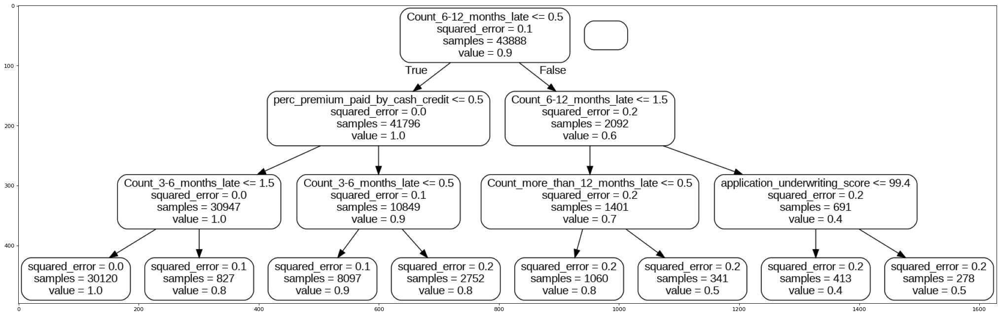

In [111]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

# Interpreting Nodes of a Tree-Based Model

The Random Forest Regressor relies on the idea of group intelligence. One of the numerous trees used to forecast the target variable is the decision tree mentioned above. With a certain input, each decision tree regression forecasts a number as the result. The average of the forecasts serves as the *final* result of the random forest regression algorithm.

The tree, as normal, includes criteria on every internal node and a value assigned to every leaf (i.e. the value to be predicted). The mean of the response variables at each internal node, or the value at each internal node, has also been mapped out.

By interpreting the nodes starting from the far left side as leaf 1, we can understand how the decision tree above functions.

In [112]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)

# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [113]:
# Print out the feature and importances

[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: Count_6-12_months_late Importance: 0.69
Variable: perc_premium_paid_by_cash_credit Importance: 0.13
Variable: Count_3-6_months_late Importance: 0.11
Variable: Count_more_than_12_months_late Importance: 0.06
Variable: application_underwriting_score Importance: 0.01
Variable: age_in_days          Importance: 0.0
Variable: Income               Importance: 0.0
Variable: no_of_premiums_paid  Importance: 0.0
Variable: sourcing_channel     Importance: 0.0
Variable: residence_area_type  Importance: 0.0
Variable: premium              Importance: 0.0


The variable importance we get from the tree-based regressor re-inforces our interpretation from the linear model.

# Getting best model using H2O AutoML

In [114]:
# Converting Pandas dataframe in H2O dataframe

loan_hf = h2o.H2OFrame(loan_df)  

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [115]:
#Converting target varibale to categorical, since the model performs better with categorical target values rather than binary
loan_hf['target'] = (loan_hf['target']==1).ifelse('Paid On Time', 'Not Paid On Time')

In [116]:
# Setting up the data split between training and test dataset.
pct_rows = 0.80  
df_train, df_test = loan_hf.split_frame([pct_rows])

In [117]:
# Setting up AutoML
def autoML(df_train, df_test):
    X = df_train.columns
    y = "target"

    X.remove(y)  # Removing the result from our predictors data

    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(x=X, y=y, training_frame=df_train)  # Trainig the dataset on different models

    return df_train, df_test, aml


# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    glm_model = ""
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model

In [118]:
# Training AutoML
autoML = autoML(df_train, df_test) 

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


In [119]:
# Leaderbord of AutoML output
autoML[2].leaderboard  

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_1_AutoML_1_20230330_15238,0.839652,0.179082,0.985038,0.429417,0.219723,0.0482781
StackedEnsemble_BestOfFamily_2_AutoML_1_20230330_15238,0.839069,0.17987,0.98479,0.462205,0.220232,0.0485021
StackedEnsemble_BestOfFamily_1_AutoML_1_20230330_15238,0.837582,0.179611,0.984763,0.452027,0.219874,0.0483445
GBM_2_AutoML_1_20230330_15238,0.836387,0.181549,0.984285,0.478244,0.221003,0.0488425
GBM_3_AutoML_1_20230330_15238,0.833977,0.183037,0.984075,0.474543,0.221641,0.0491246
GBM_1_AutoML_1_20230330_15238,0.832956,0.180546,0.984082,0.453527,0.220263,0.0485158
GLM_1_AutoML_1_20230330_15238,0.830819,0.184484,0.984162,0.432176,0.221802,0.0491963
GBM_4_AutoML_1_20230330_15238,0.827612,0.185361,0.983367,0.460598,0.222864,0.0496683
XGBoost_2_AutoML_1_20230330_15238,0.825524,0.185502,0.983207,0.478861,0.223756,0.0500666
XGBoost_1_AutoML_1_20230330_15238,0.816415,0.190459,0.982225,0.487917,0.225608,0.0508992


In [120]:
# Getting Best Model
autoML_model = getBestModel(autoML[2])  
print(autoML_model)

3
Model Details
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_2_AutoML_1_20230330_15238


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    23                 23                          28457                  7            7            7             79            112           93.913

ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.043439957737676956
RMSE: 0.20842254613567351
LogLoss: 0.1646545183515012
Mean Per-Class Error: 0.3822378058552201
AUC: 0.8656617305905343
AUCPR: 0.9875573998882143
Gini: 0.7313234611810686

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5792057593746024
                  Not Paid On Time    Paid On Time    Error    Rate
--------------

In [121]:
autoML_model.predict(test_data=df_test)
#autoML_model.predict

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


predict,Not Paid On Time,Paid On Time
Not Paid On Time,0.491224,0.508776
Paid On Time,0.0551374,0.944863
Paid On Time,0.0352004,0.9648
Paid On Time,0.0172439,0.982756
Paid On Time,0.0234862,0.976514
Paid On Time,0.029392,0.970608
Paid On Time,0.0148877,0.985112
Paid On Time,0.0611458,0.938854
Paid On Time,0.0207823,0.979218
Paid On Time,0.0179902,0.98201


#SHAP, Partial Dependence Plot, Individual Conditional Expectation Analysis for AutoML Best Model

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## GBM_2_AutoML_1_20230330_15238

,Not Paid On Time,Paid On Time,Error,Rate
Not Paid On Time,73.0,920.0,0.9265,(920.0/993.0)
Paid On Time,43.0,14440.0,0.003,(43.0/14483.0)
Total,116.0,15360.0,0.0622,(963.0/15476.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

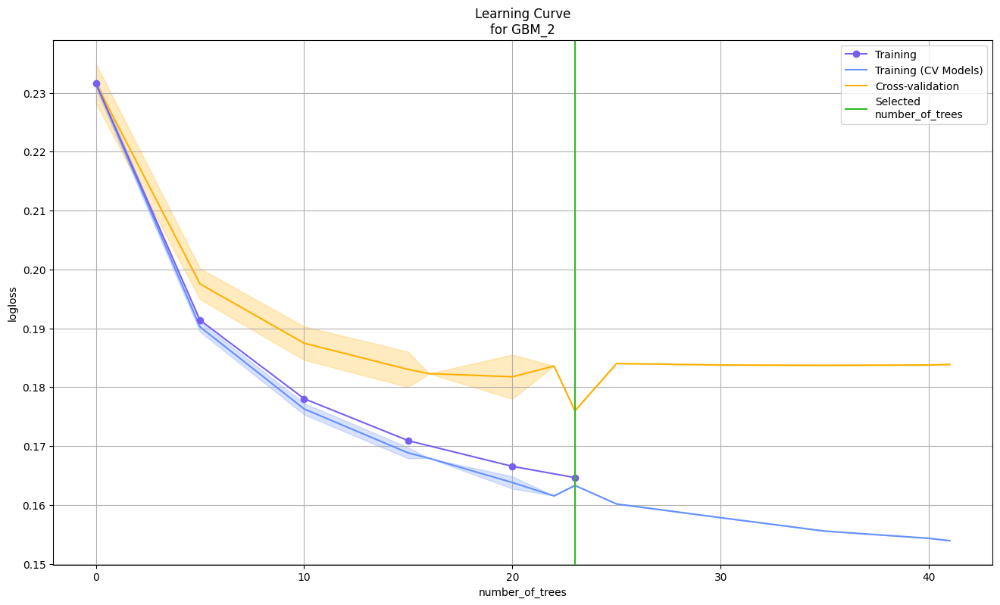

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

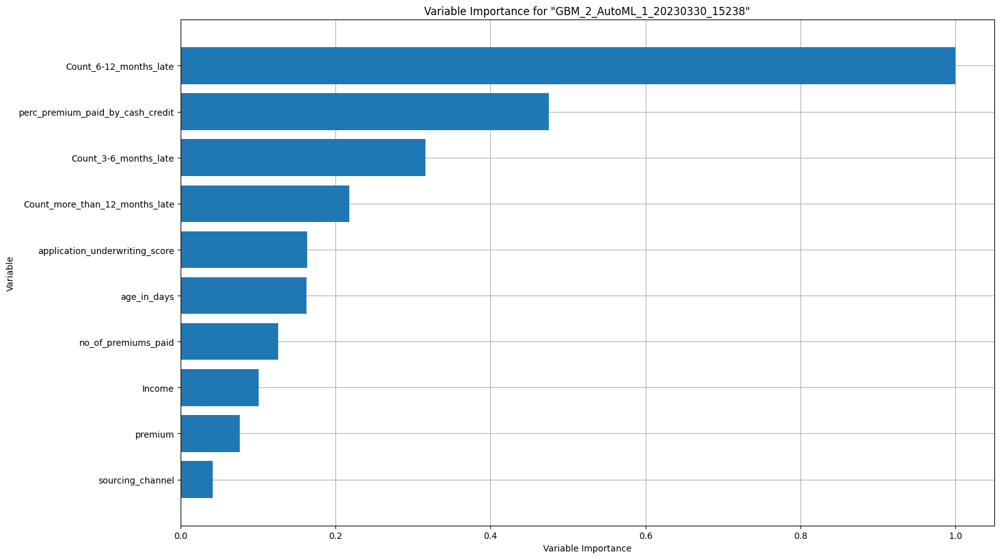

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

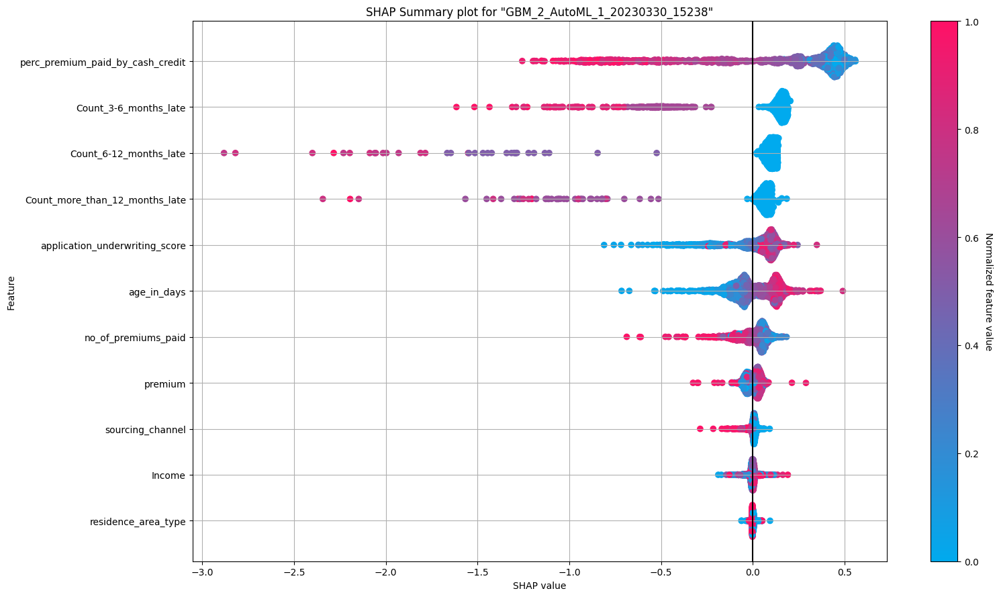

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

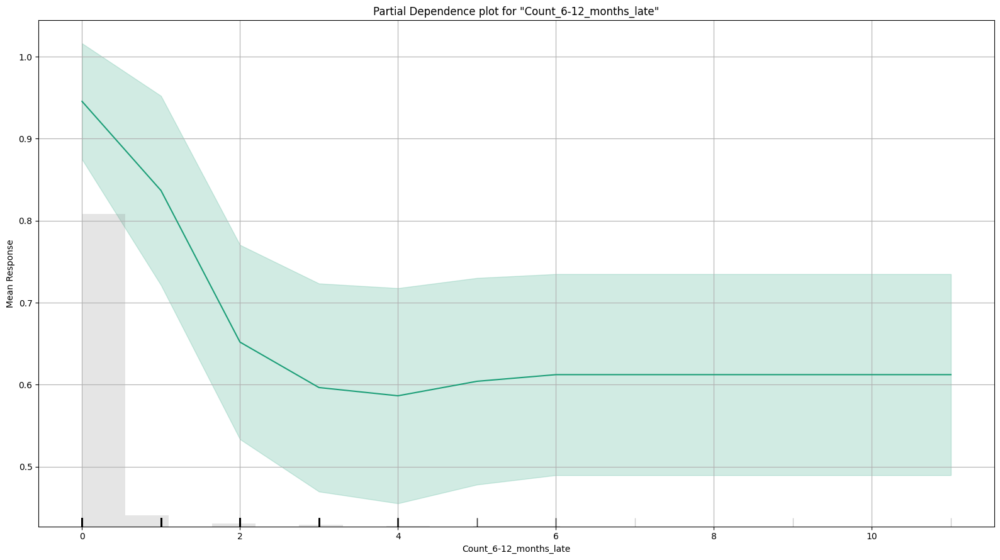

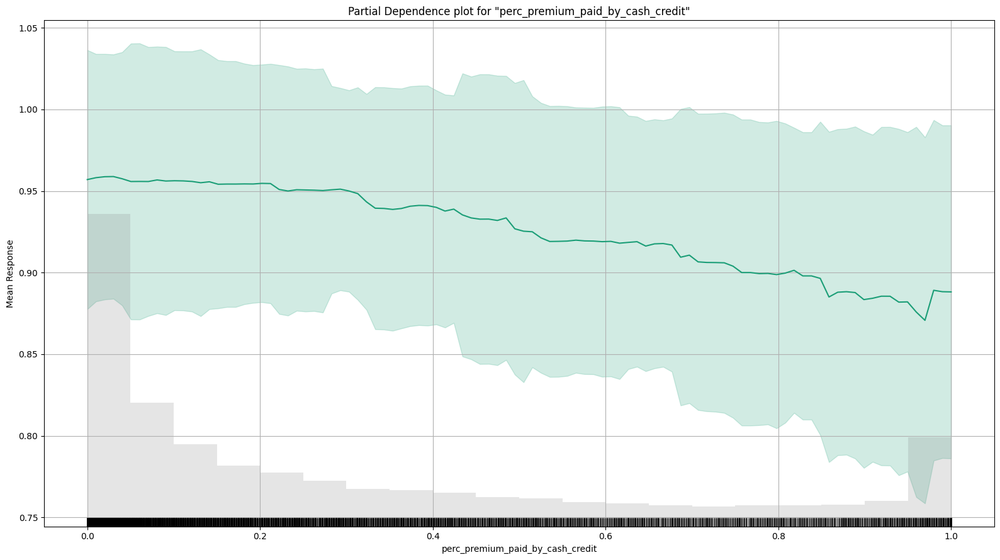

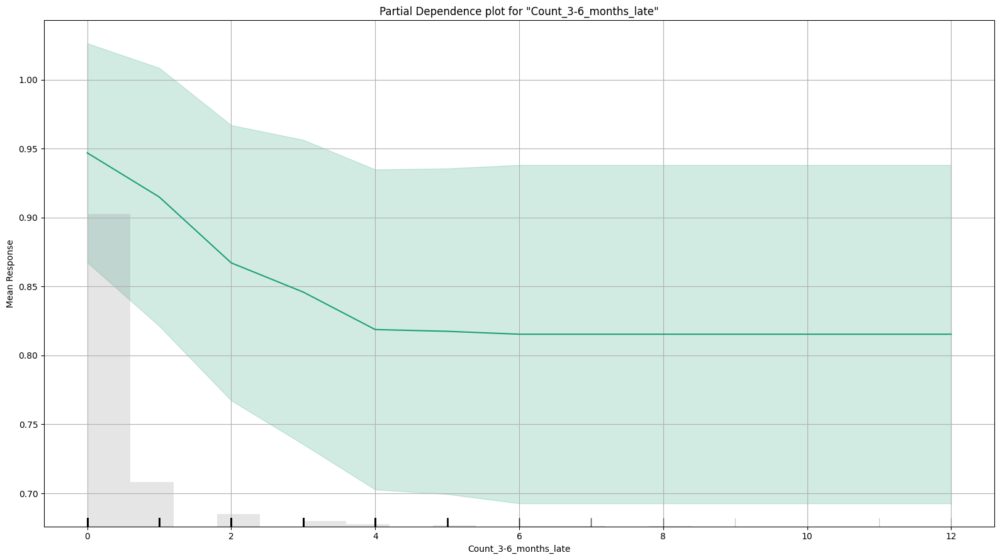

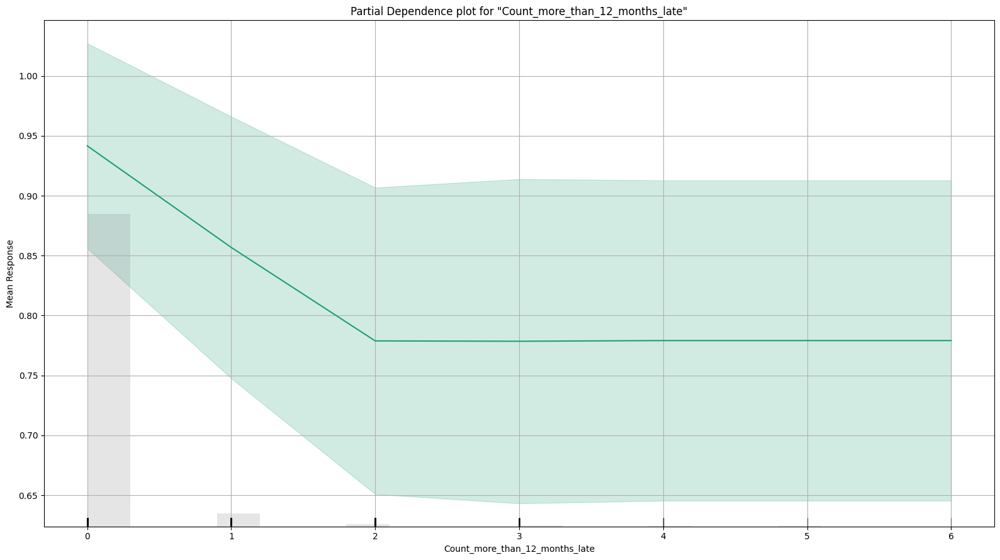

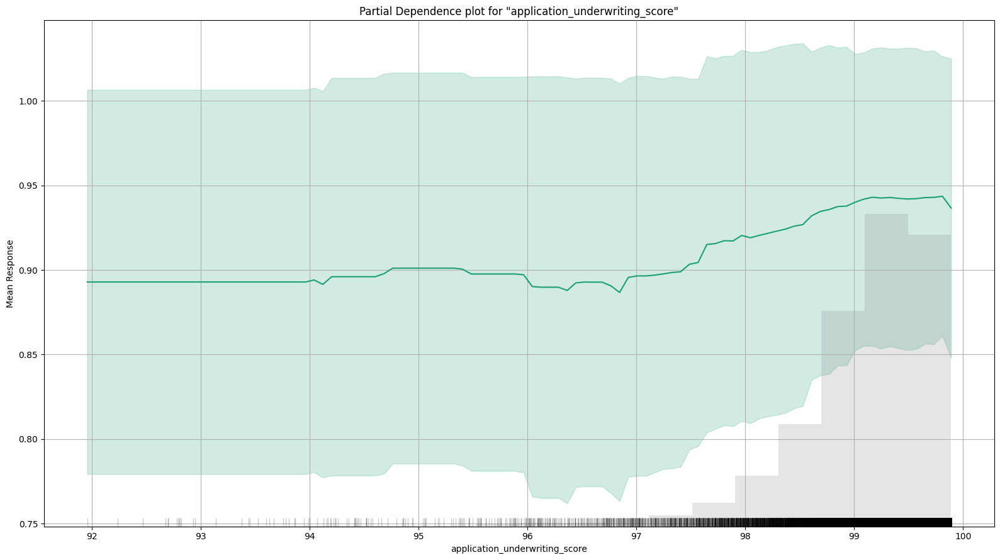

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## GBM_2_AutoML_1_20230330_15238

,Not Paid On Time,Paid On Time,Error,Rate
Not Paid On Time,73.0,920.0,0.9265,(920.0/993.0)
Paid On Time,43.0,14440.0,0.003,(43.0/14483.0)
Total,116.0,15360.0,0.0622,(963.0/15476.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

In [122]:
# AutoML Explainability
autoML_model.explain(autoML[1])  

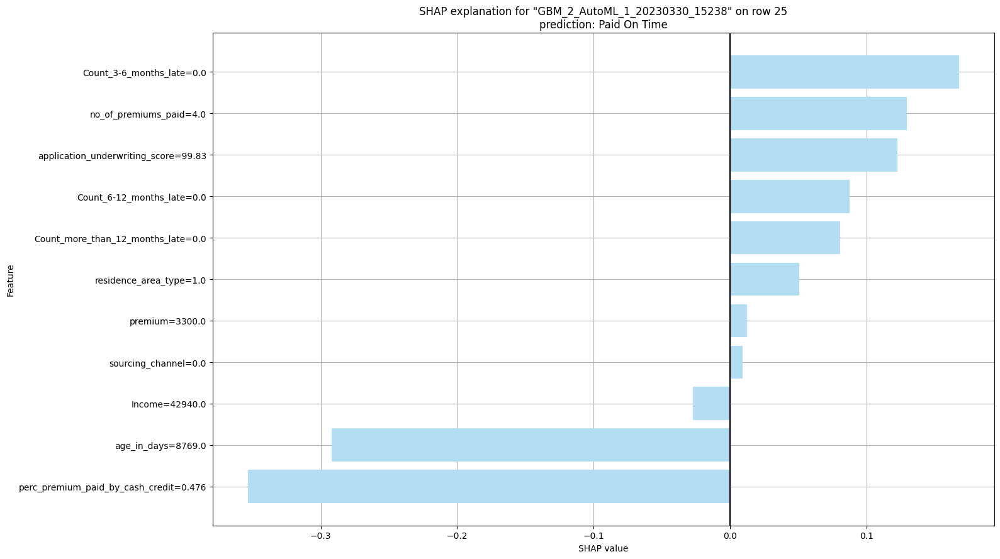

In [123]:
# Lets Analyze the 25th row in Test Data
autoML_model.shap_explain_row_plot(autoML[1], 25) 

#Interpreting Best Model from AutoML

## Variable Importance
- In the variable importance plot we can observe that the plot replicates the results which we got from the Linear Model and Tree-Based Model above. The variable importance has been scaled between 0 to 1 for ease of understanding

## SHAP Summary
From the SHAP summary diagram, following conclusion can be made - 

1. The features are arranged in order of their significance in making the prediction. perc_premium_paid_by_cash_credit being more signifiant followed by Count_3-6_months_late and so on. residence_area_type being least significant.

2. The SHAP value axis position reflects whether a feature positively or negatively influences the prediction. The farther a data point deviates from a 0.0 SHAP value, the greater its impact. Count_6-12_months_late has the most impact on the premium paid on time or not as red points are widely scattered. Sourcing_channel has the least significant. Based on this visual, we can conclude that there is a significant improvement in the premium paid on time or not as Count_6-12_months_late increases.

SHAP analysis offers an advantage over traditional feature importance methods as it allows for the visualization of how a feature affects the target at various values. Unlike standard methods, which often overestimate the significance of continuous or high-cardinality categorical variables.

## Partial Dependence Plot (PDP)

A partial dependence plot illustrates the impact of a feature on the target variable while holding all other variables constant, by altering the value of that particular variable to obtain its PDP.

1. It is evident that if all other variables remain constant and a slight modification is made in the count of 6-12 months late, the mean response increases between 0 and 2 for count_6-12_months_late. It could be inferred that this particular range of count_6-12_months_late might be the determining factor in whether the premium is paid on time or not.


2.  Likewise, if all other variables are held constant and a slight modification is made in count_3-6_months_late, we can notice a decrease in the mean response of quality within the range of 0.86 to 0.80. Thus, it can be deduced that this range plays a crucial role in the payment of premiums. 



## SHAP explanation for a Premium paid on time or not.
Analyzing the 25th premium paid in the dataset, Y-axis has the features with its values from the premium paid and X-axis has its corresponding SHAP values. This graph shows the contribution of features for a given instance.




# SHAP Analysis for Linear and Tree-Based Models



Permutation explainer: 1001it [01:04, 12.85it/s]


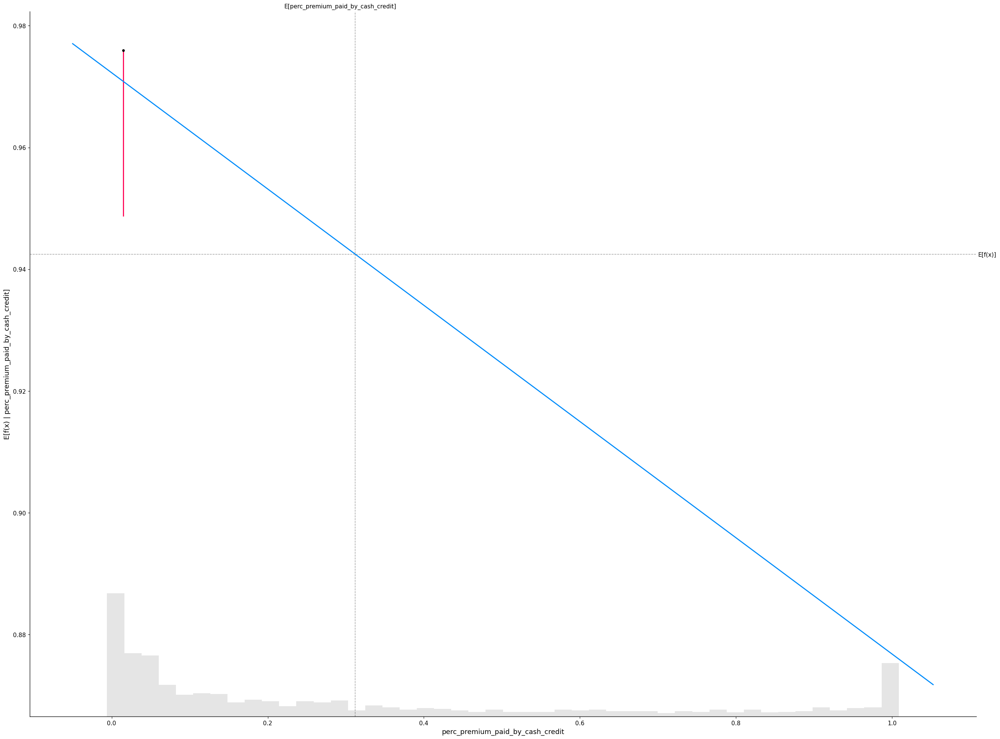

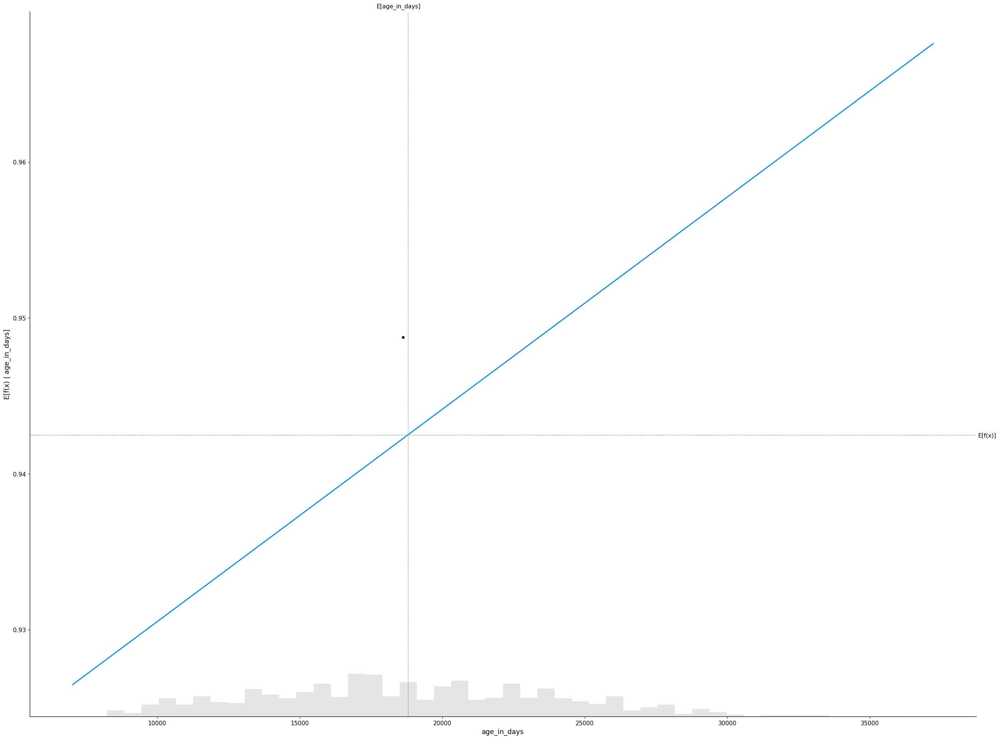

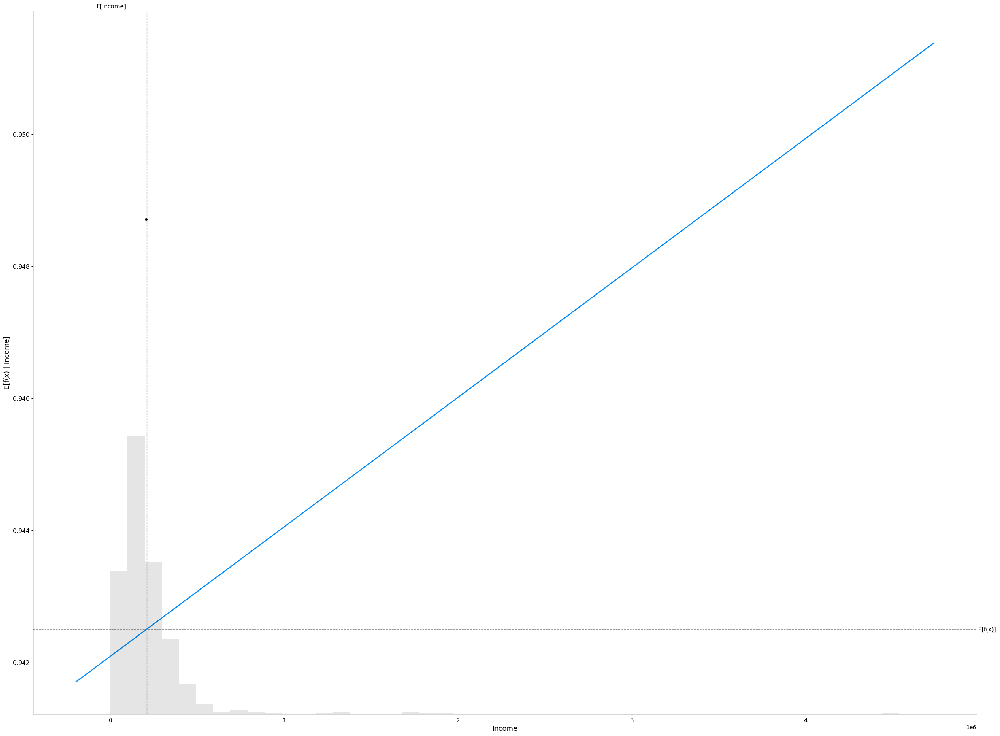

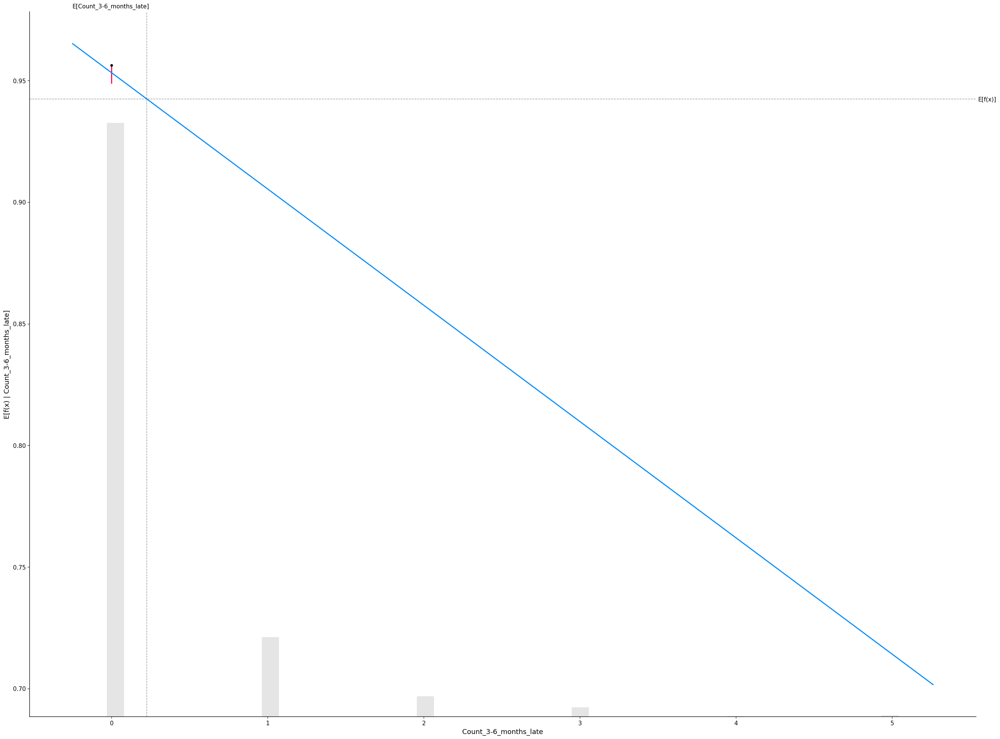

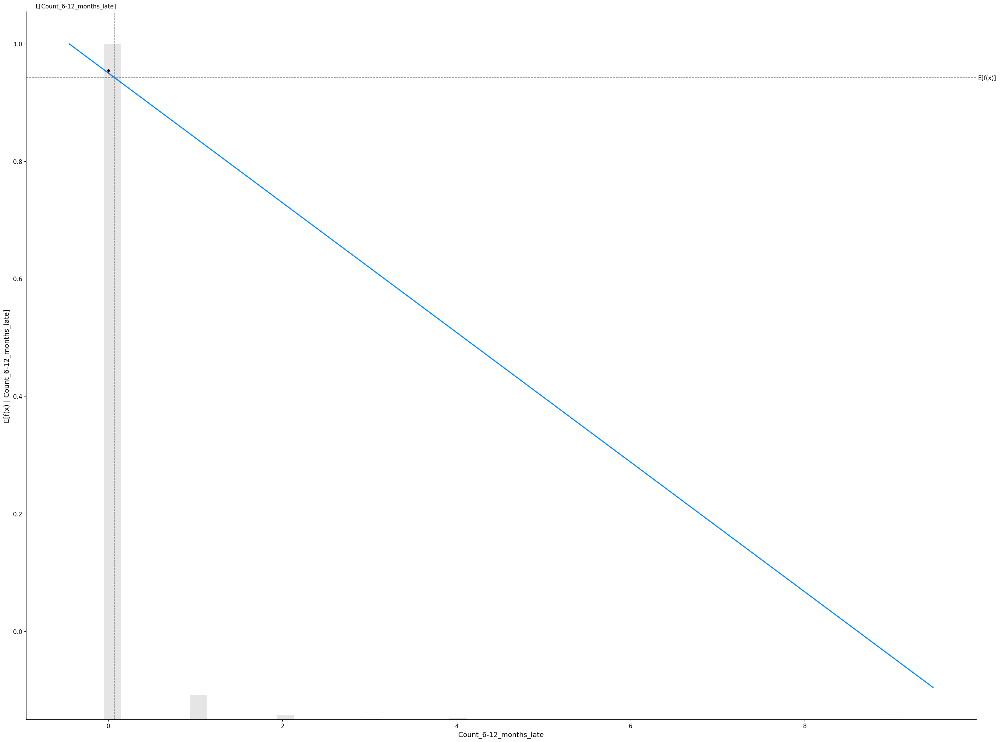

...

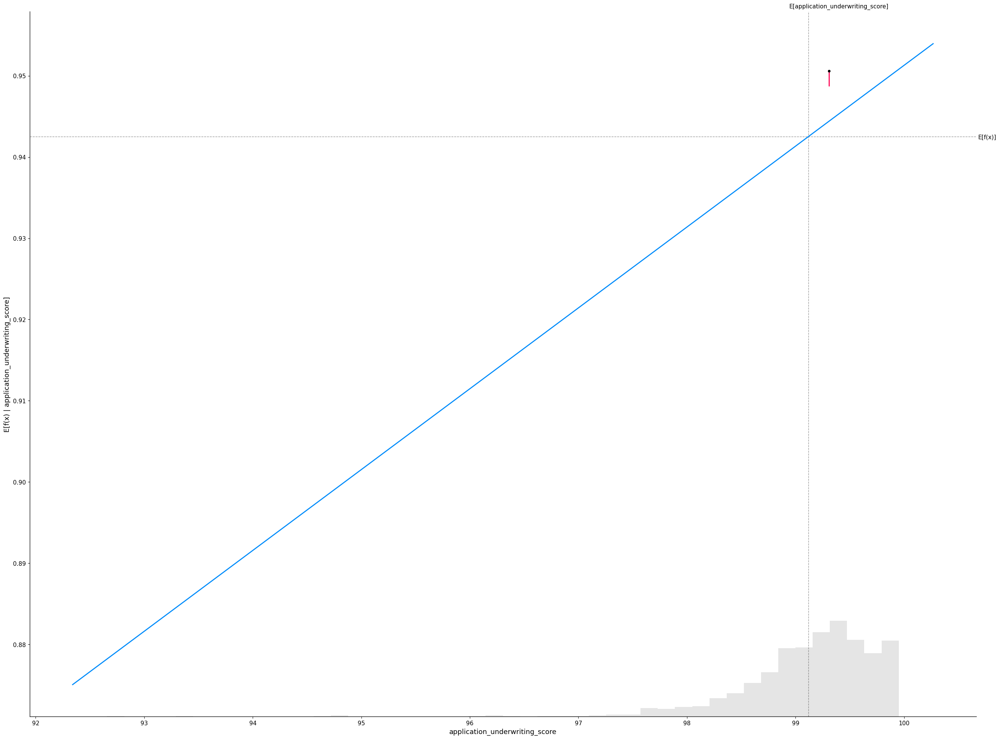

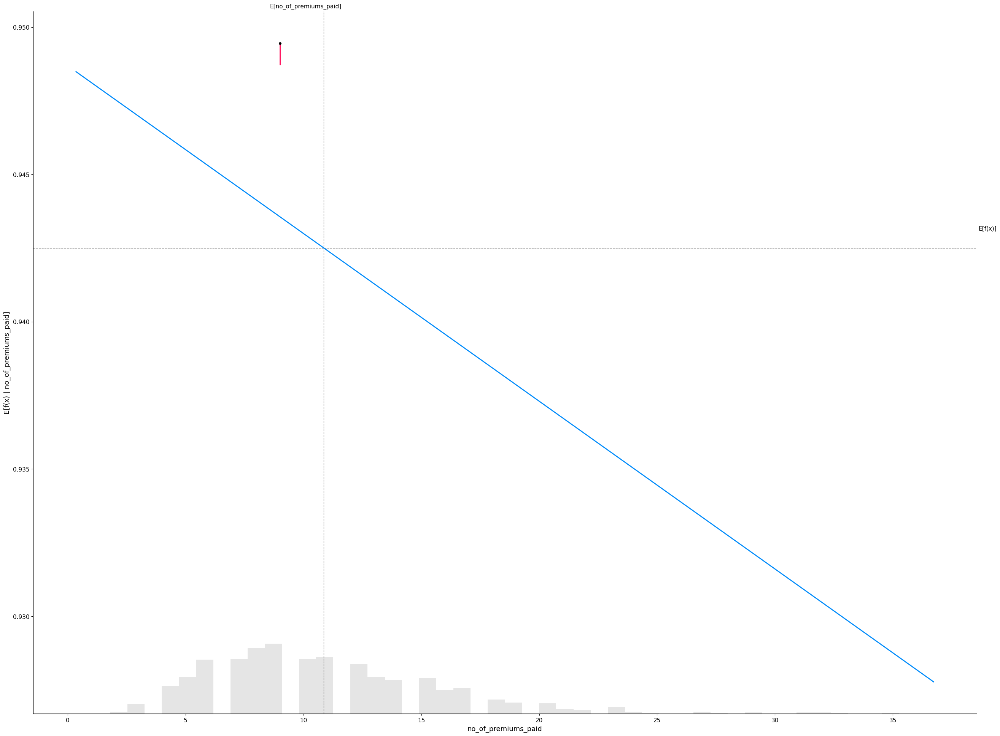

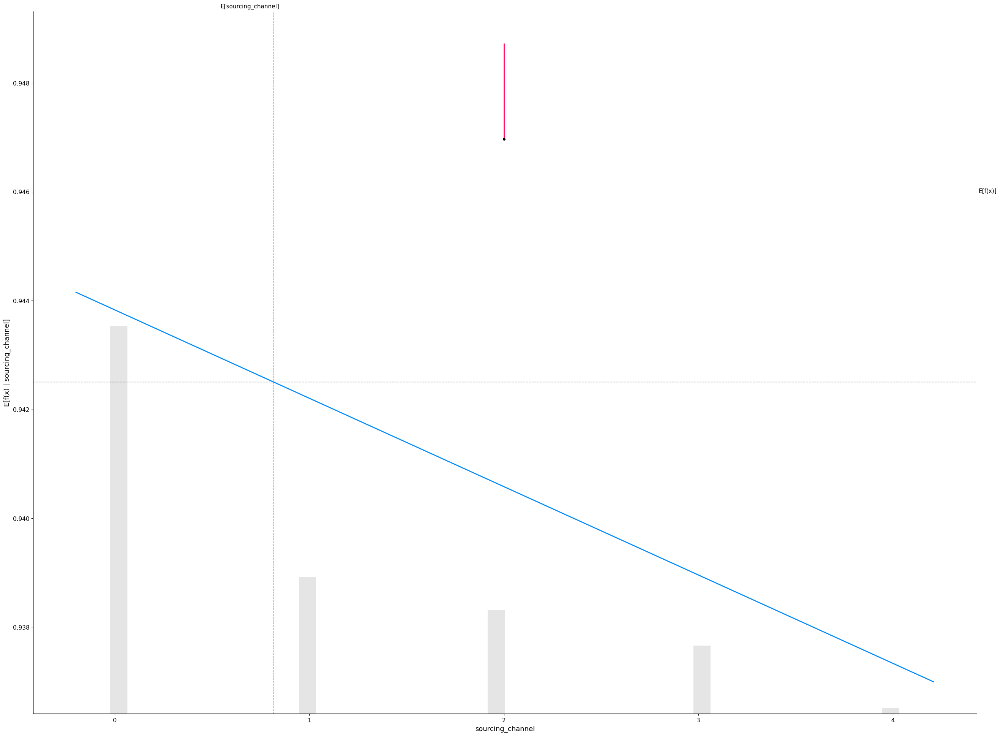

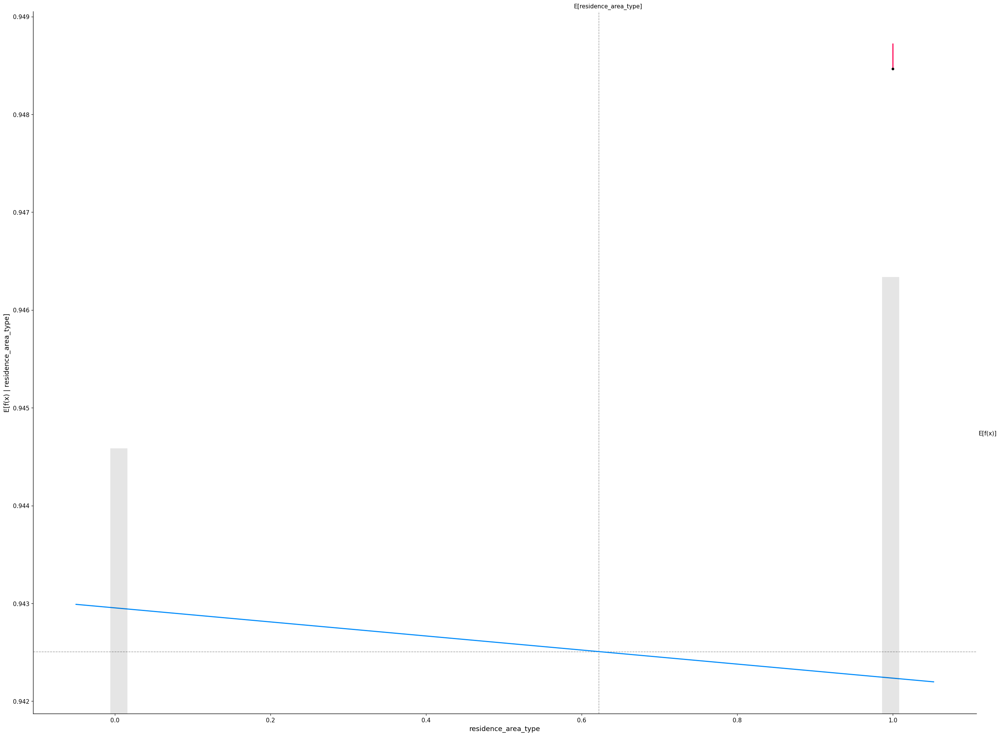

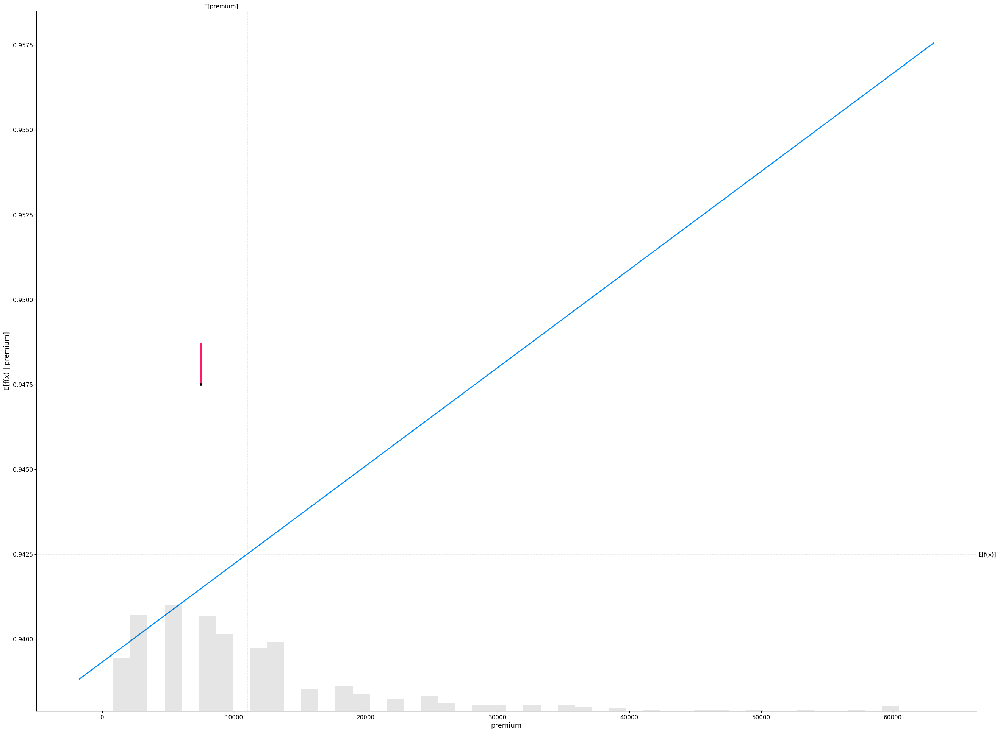

In [124]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(linear_model.predict, x_train_1000)
linear_shap_values = linear_explainer(x_train_1000)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_1000,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

SHAP Values - Tree Based Model

Permutation explainer: 1001it [01:17, 10.94it/s]


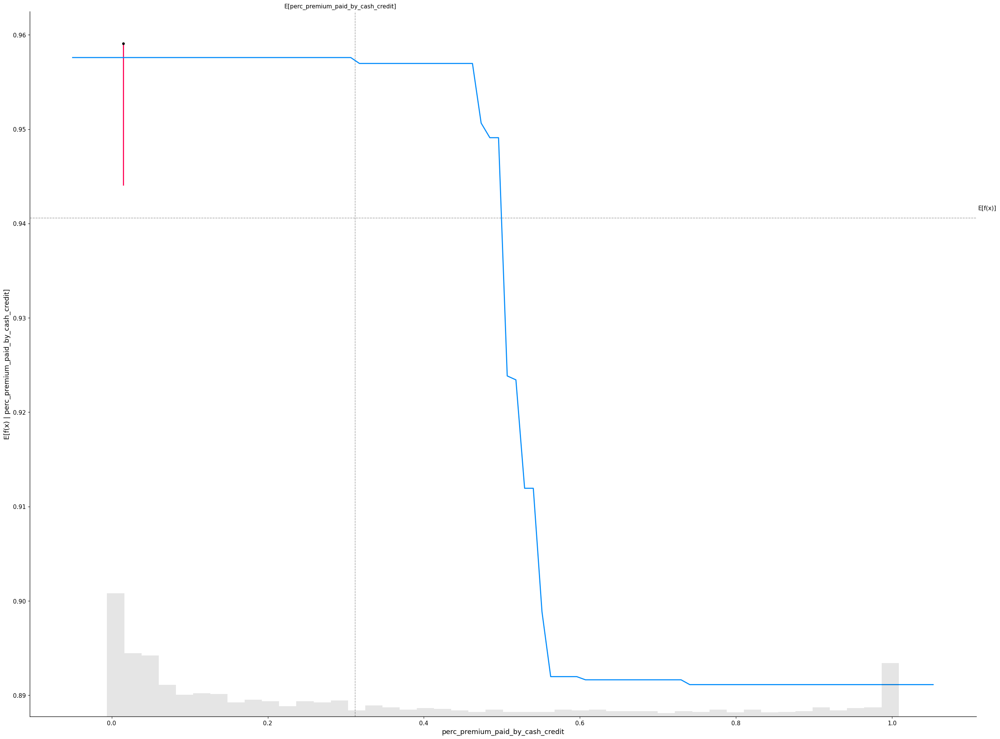

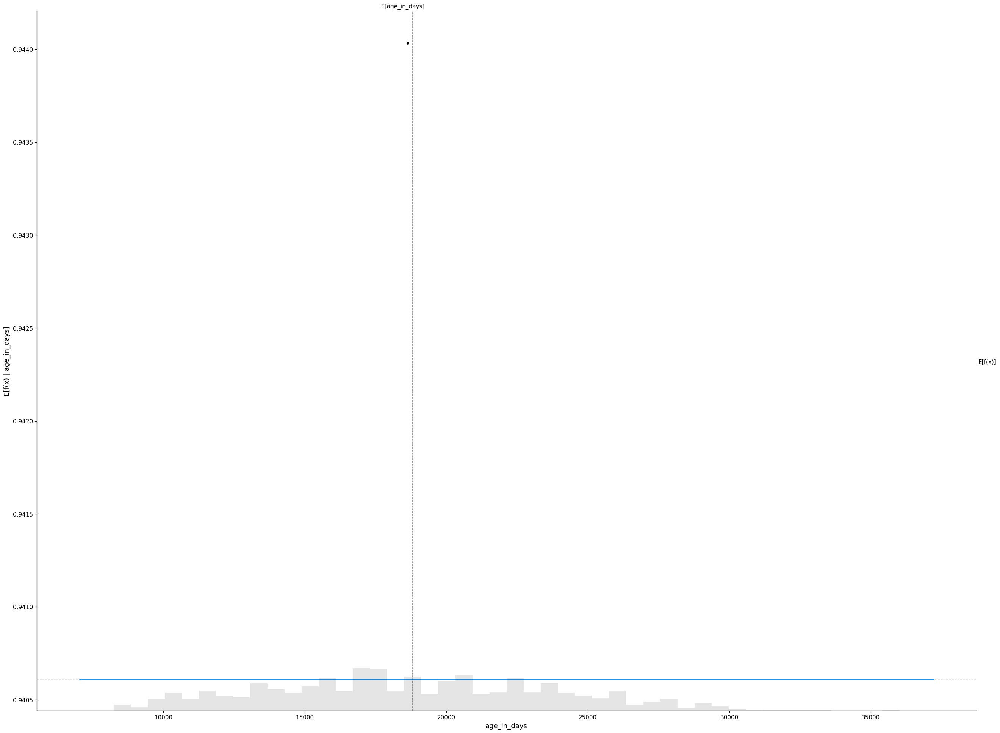

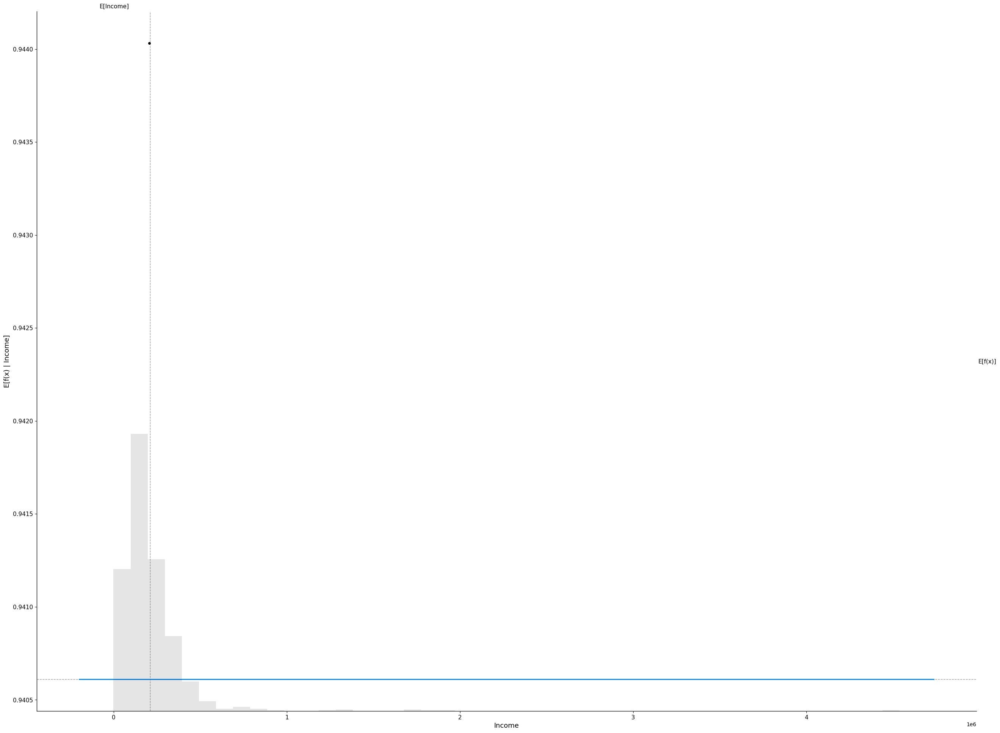

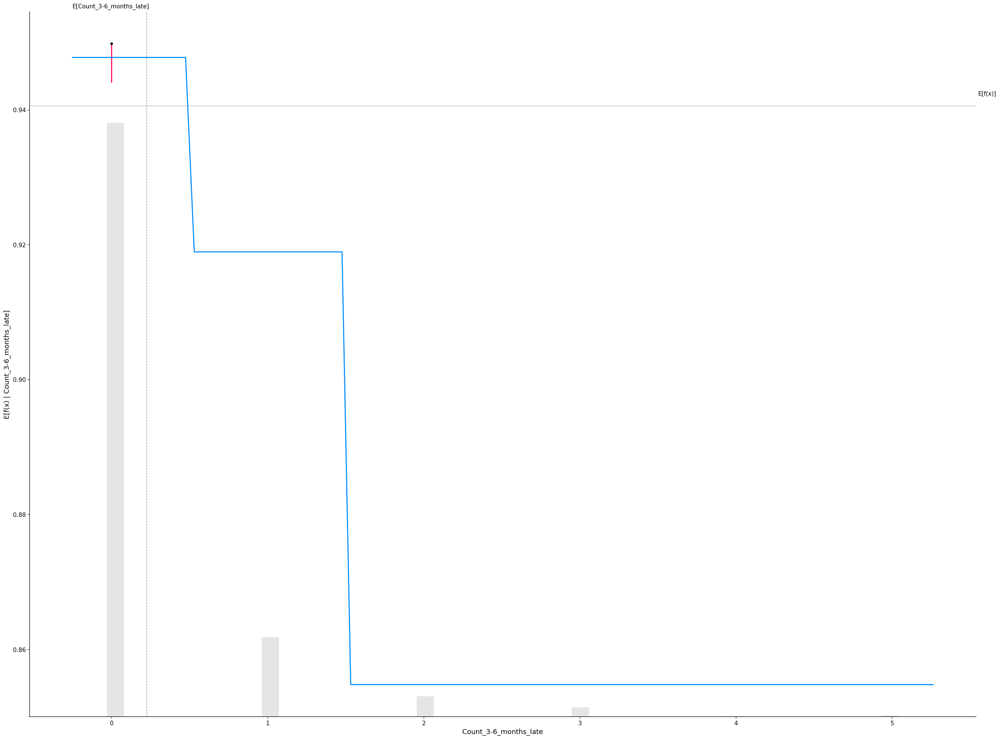

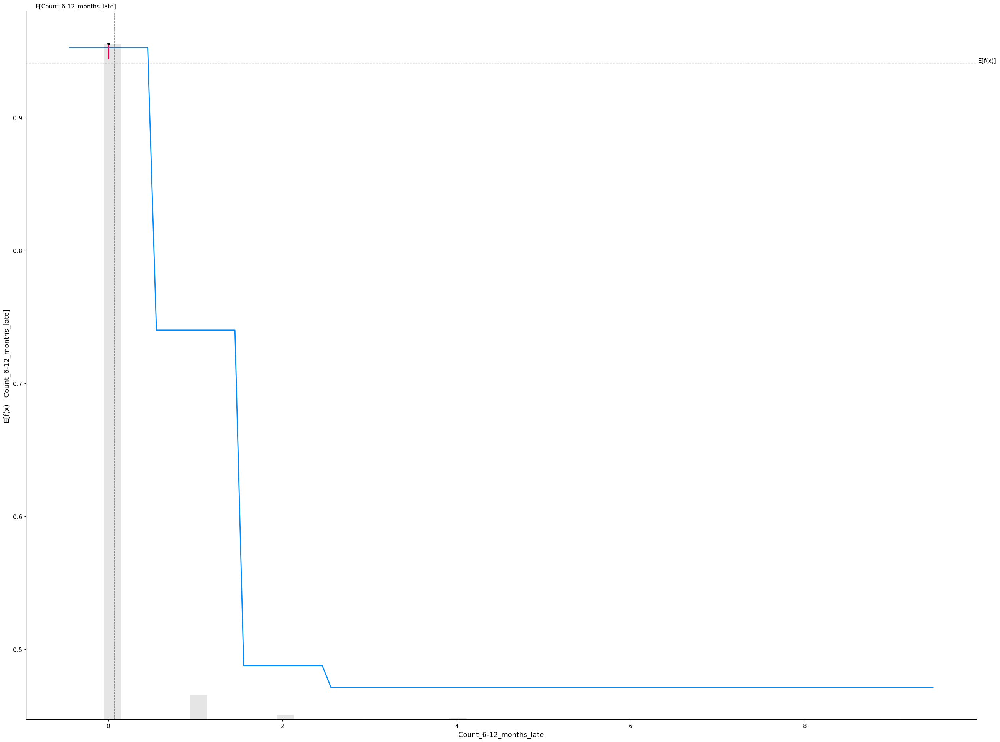

...

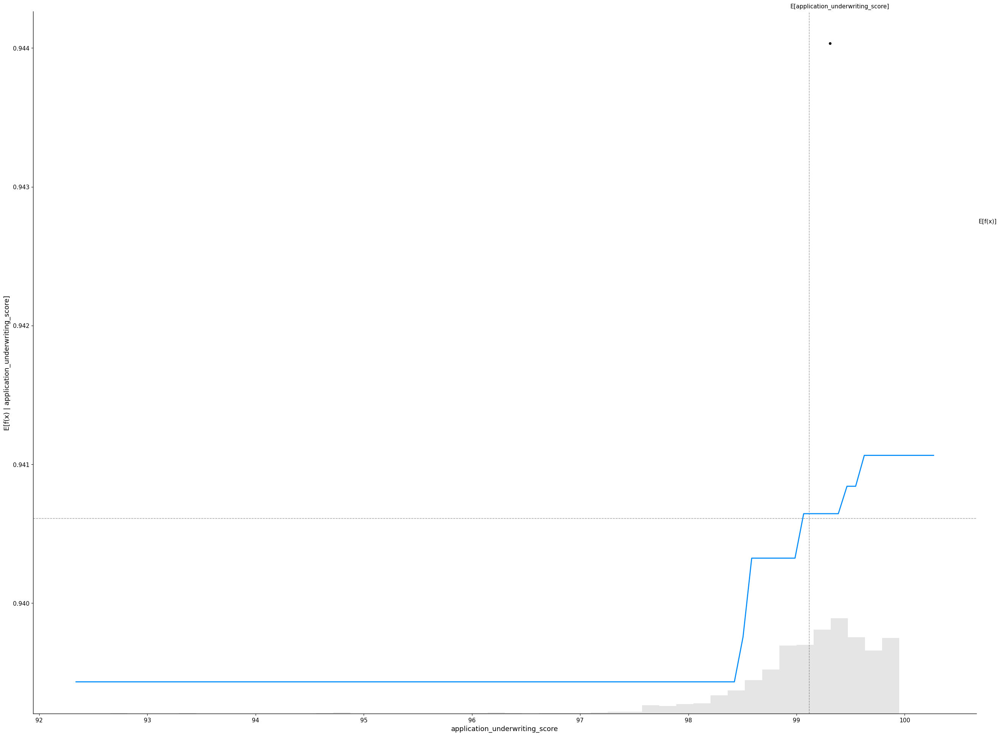

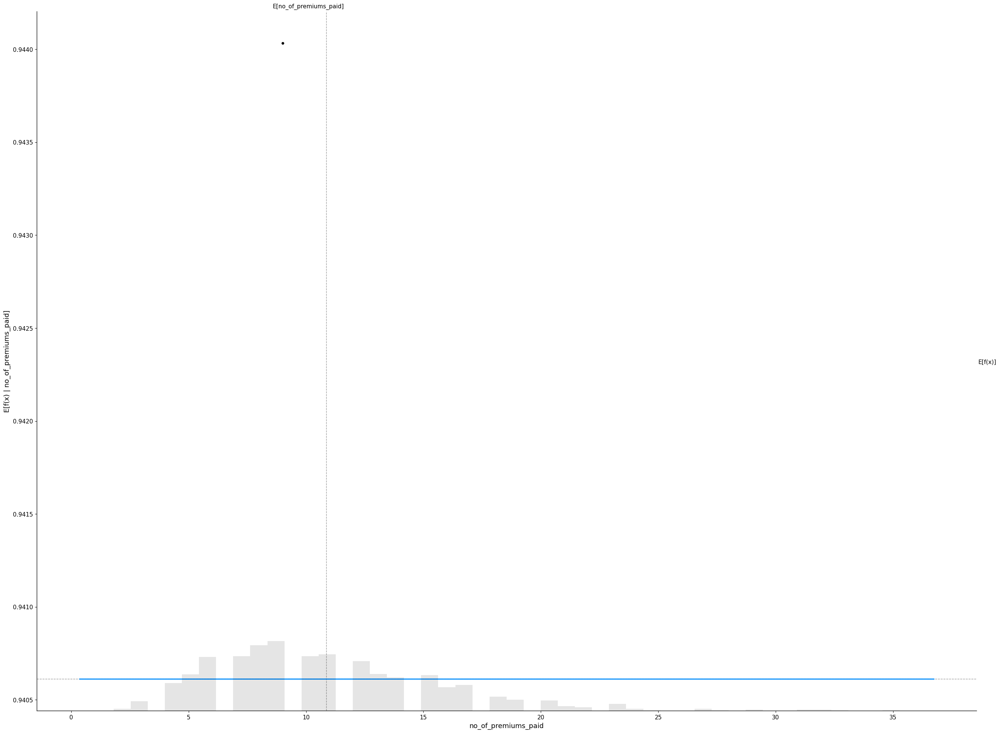

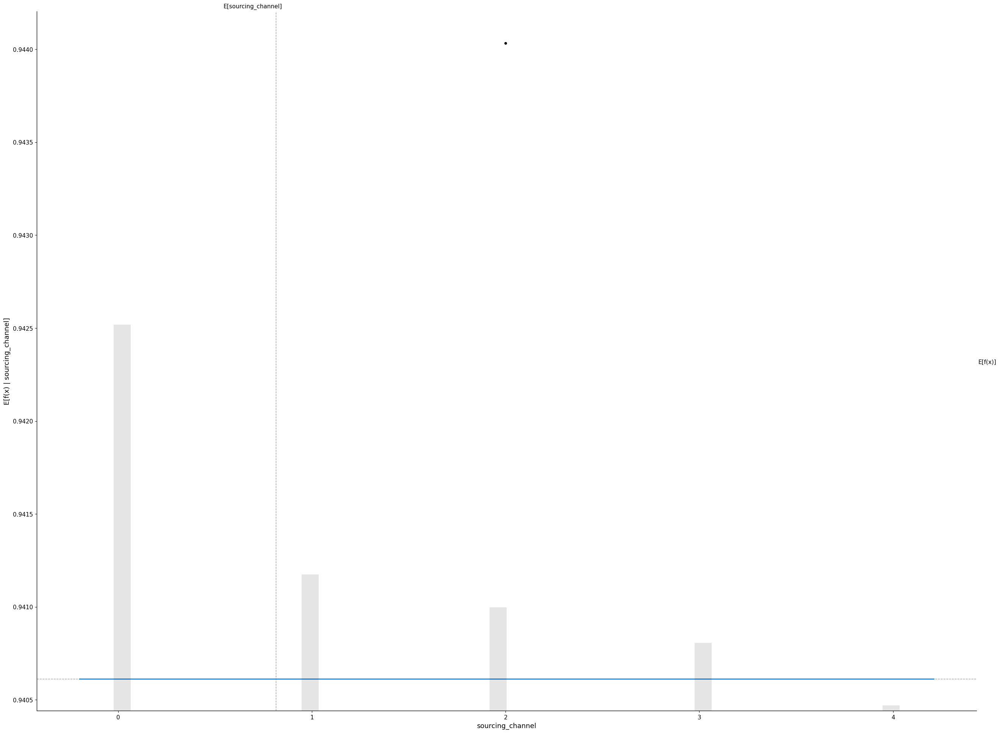

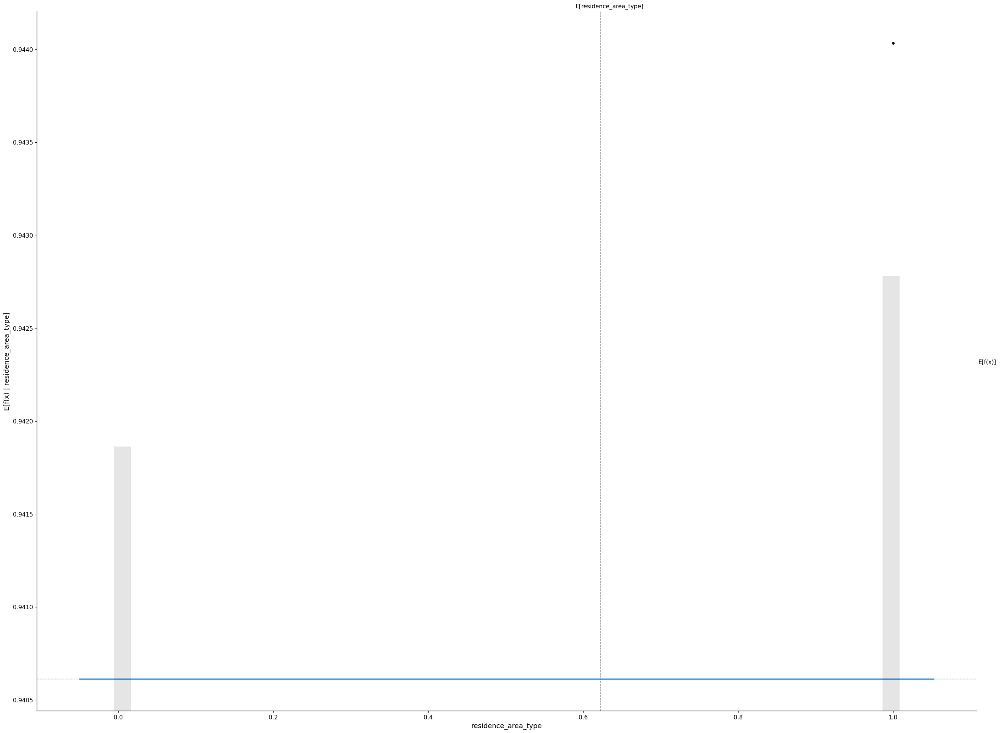

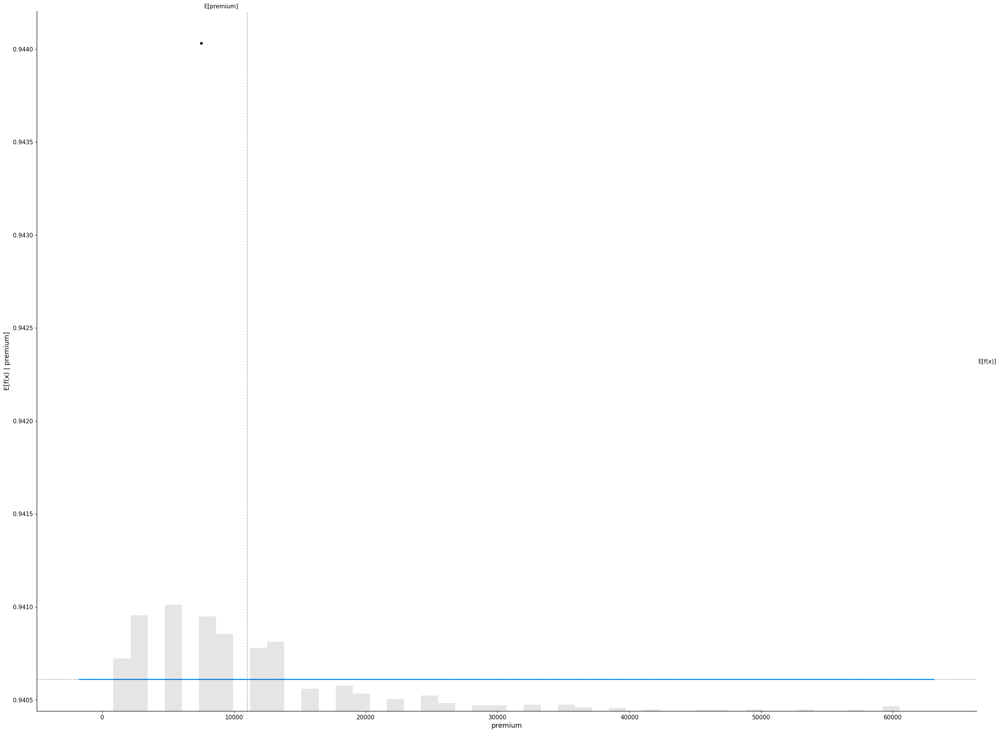

In [125]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, x_train_1000)
tree_shap_values = tree_explainer(x_train_1000)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_1000,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

# Interpreting SHAP Feature Importance Plot for Linear and Tree-based model
SHAP feature importance ranks features based on their absolute Shapley values, averaged across the data and sorted in descending order of significance.

The following plots are 

1.   SHAP feature importance for a linear model
2.   SHAP feature importance for tree-based model

As demonstrated in the plots below, there is a discrepancy in feature significance between the two models.

- In linear model, Count_6-12_months_late is the second most important feature but in tree-based model Count_3-6_months_late is the second most important feature when we consider the average of SHAP values to calculate feature importance.




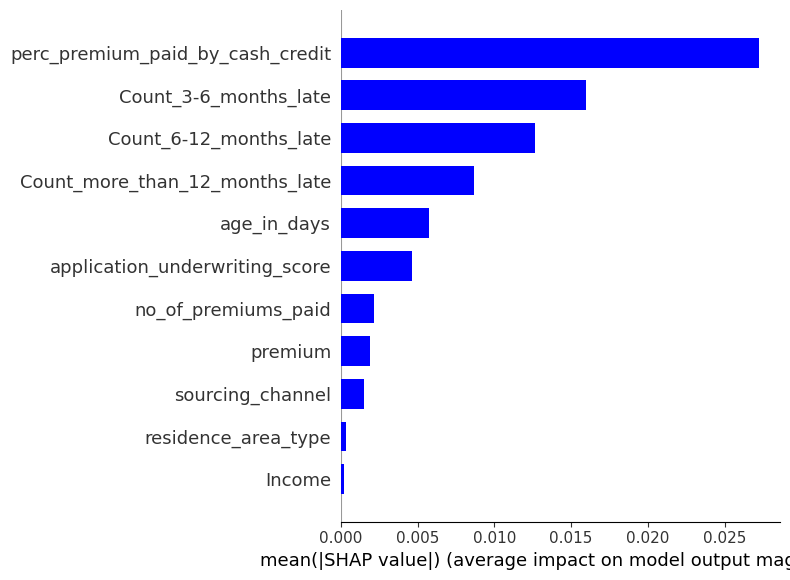

In [127]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="blue")

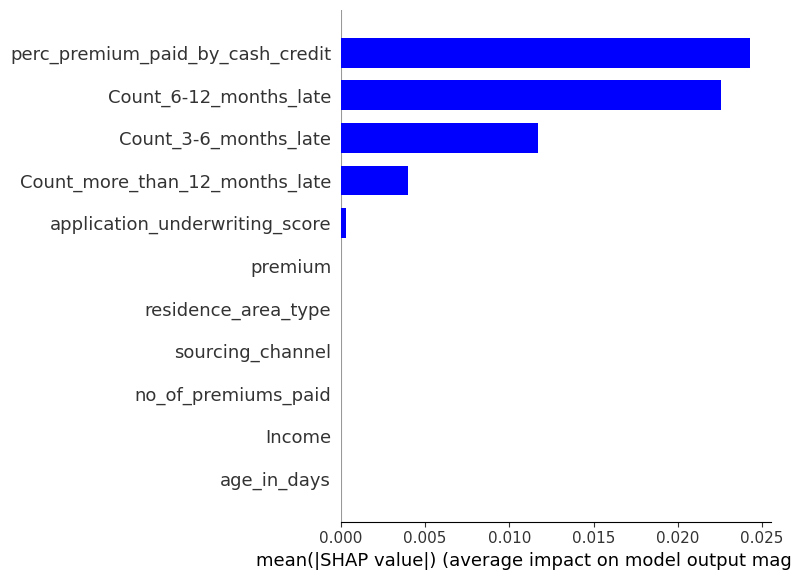

In [128]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="blue")

# Interpreting Waterfall SHAP visualization

The SHAP waterfall plot can be interpreted as follows: The top of the plot shows the model's total output value for a specific instance. Each row represents a feature's contribution to the output value, and the bar's length indicates the magnitude of its effect. Blue bars denote positive values, while red bars represent negative values. The baseline value is indicated by a vertical dashed line in the middle of the plot. By examining the SHAP waterfall plot, you can quickly determine which features have the greatest influence on the model's output and in which direction (positive or negative). This is advantageous for model interpretability and feature selection.




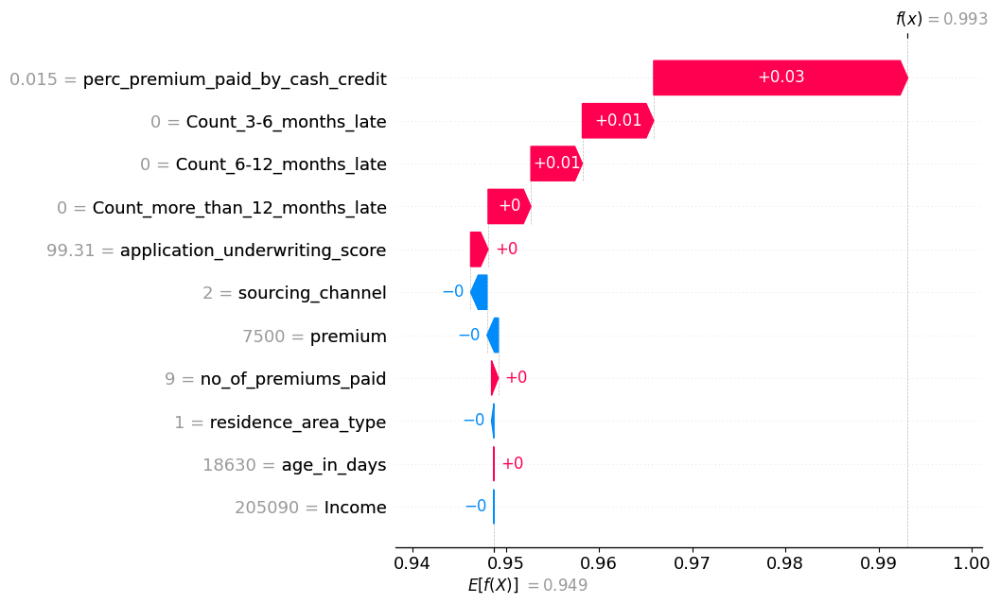

In [129]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

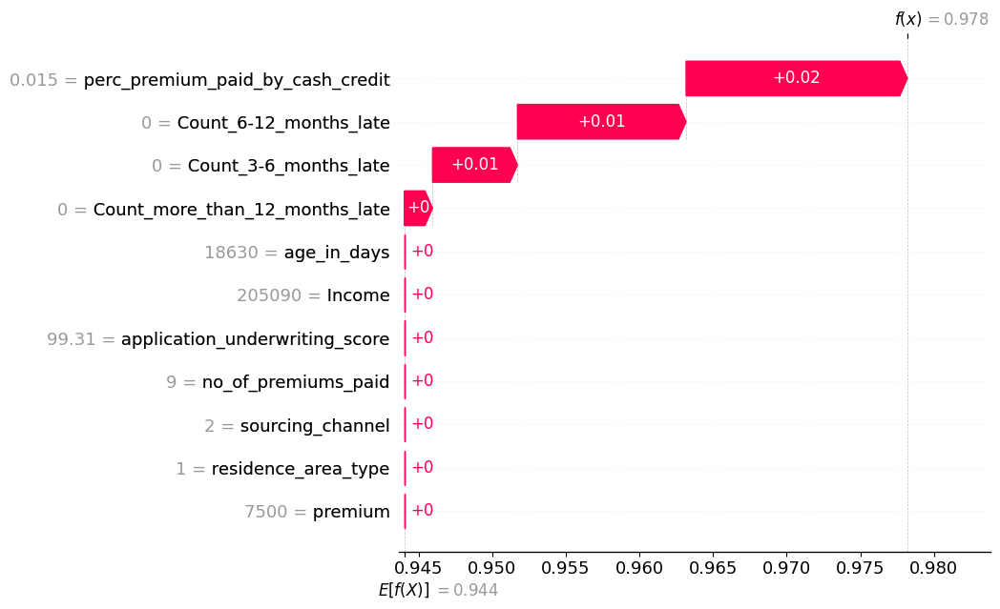

In [130]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

# Interpret the summary plot for the Linear and Tree-based model
One way to analyze an ML model and understand the impact of features on the target variable is to list the features in descending order of their importance. This approach provides a straightforward and simple method to assess the relative influence of each feature.
Highest values are represented by red color and low value are by blue color. If a dot(a feature of wine) is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact. The intensity of impact that a dot had is represented by its position on the x-axis, with greater distances from the axis indicating greater intensities.

Let us try to understand how both models are performing side by side

*   Higher value of Count_3-6_months_late tends to have a negavtive impact on the premium paid on time.
*   Lower values of sourcing_channel tend to have a less impact on the premium paid on time.

Interpreting how our model is functioning can be greatly aided by this visualization.

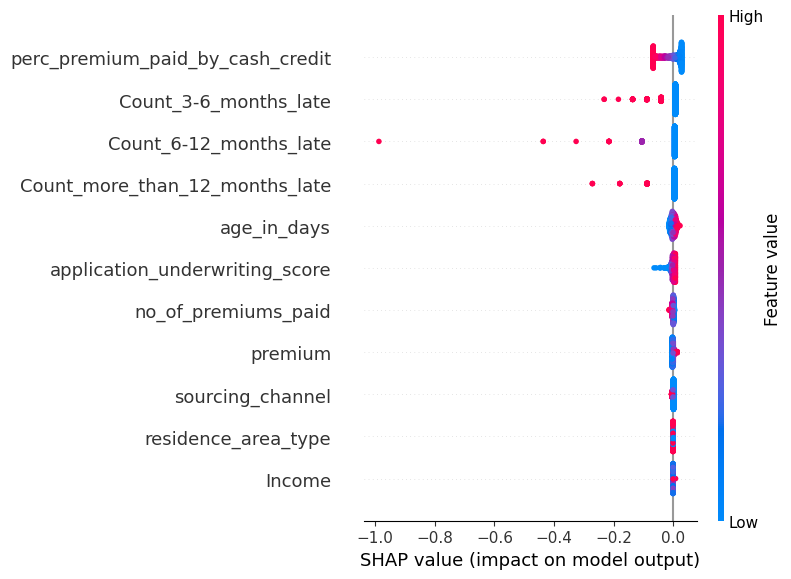

In [131]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train_1000)

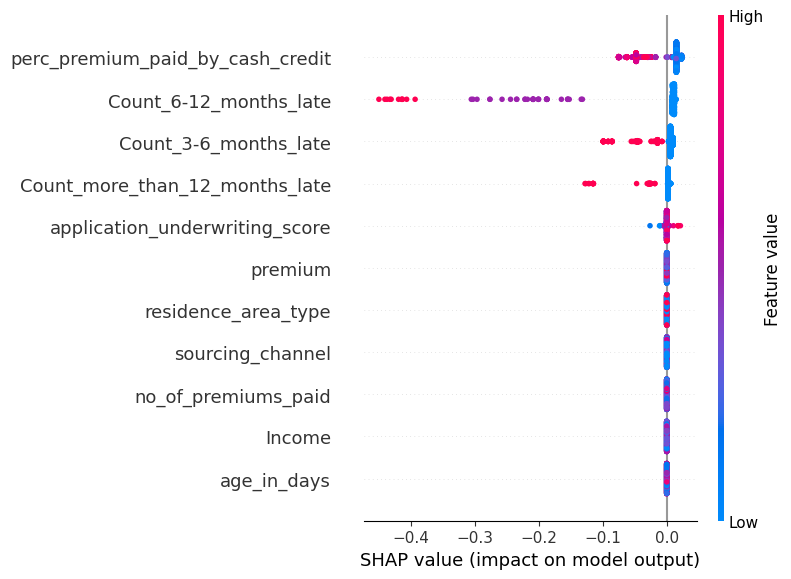

In [132]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, x_train_1000)

#Interpreting SHAP dependence plot for Linear and Tree-based model
SHAP dependence plots are a powerful tool for understanding how individual features affect the predictions of a machine learning model. The interpretation of these plots can vary depending on whether the model is linear or tree-based.

For a linear model, a SHAP dependence plot shows how the predicted outcome changes as the value of a specific feature changes. The plot typically shows a straight line with a slope that indicates the magnitude and direction of the effect of the feature on the prediction. A positive slope means that higher values of the feature increase the predicted outcome, while a negative slope means that higher values decrease the predicted outcome.

For a tree-based model, a SHAP dependence plot shows how the predicted outcome changes as the value of a specific feature changes, but with a more complex shape than the straight line of a linear model. The plot typically shows a curve that indicates how the effect of the feature on the prediction changes as the value of the feature changes. In some cases, the curve may show a threshold effect, where the impact of the feature changes abruptly once a certain threshold value is reached.








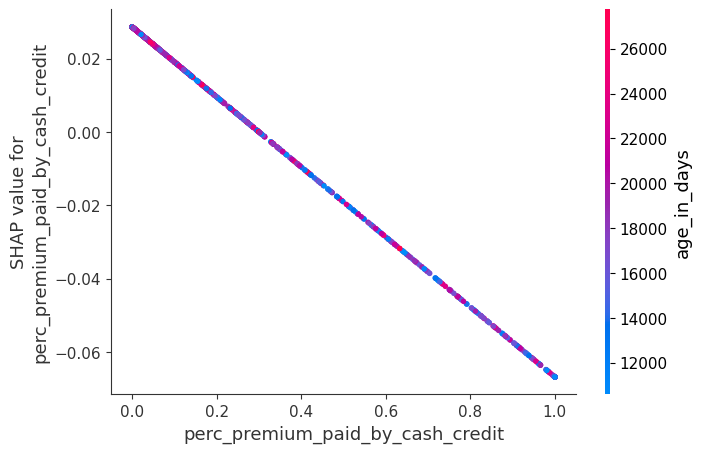

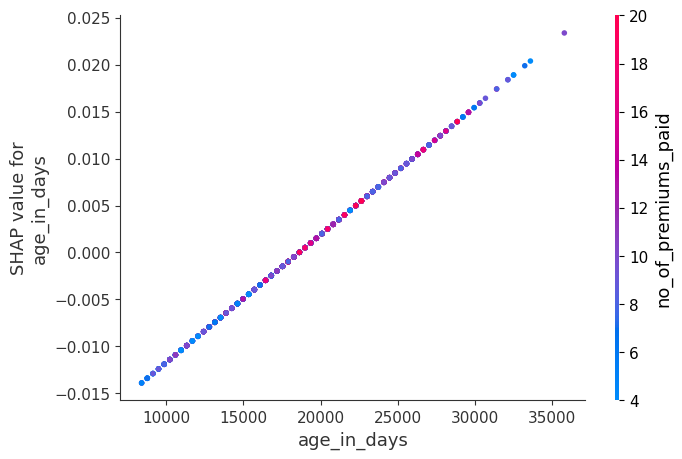

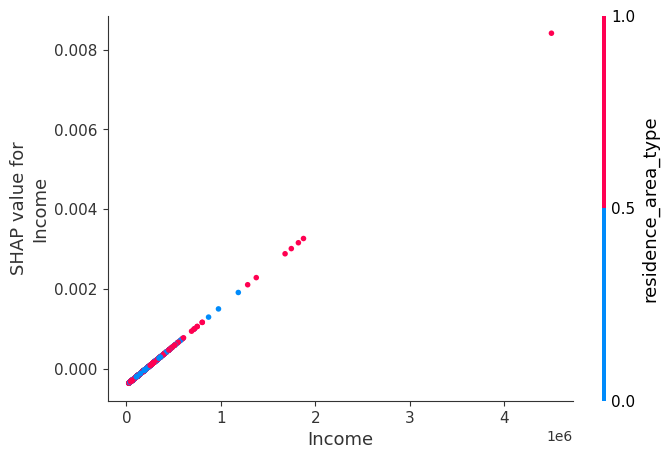

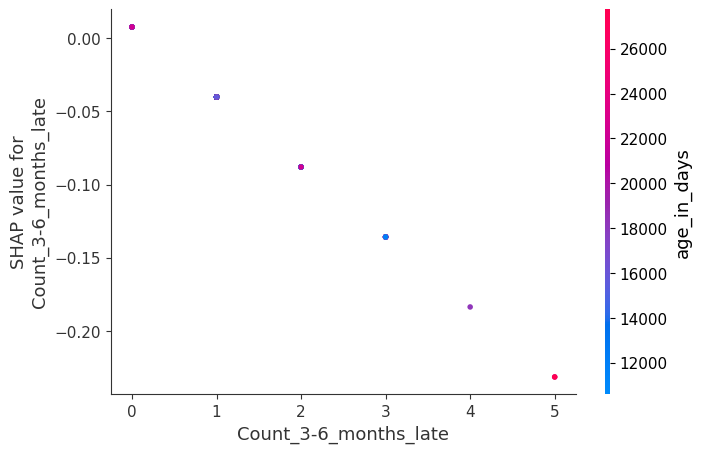

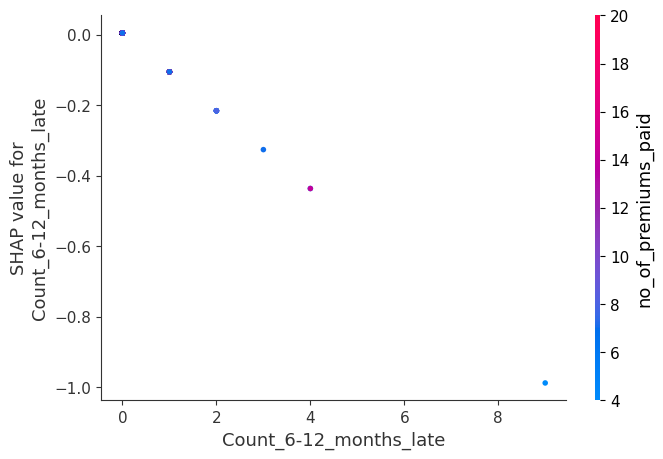

...

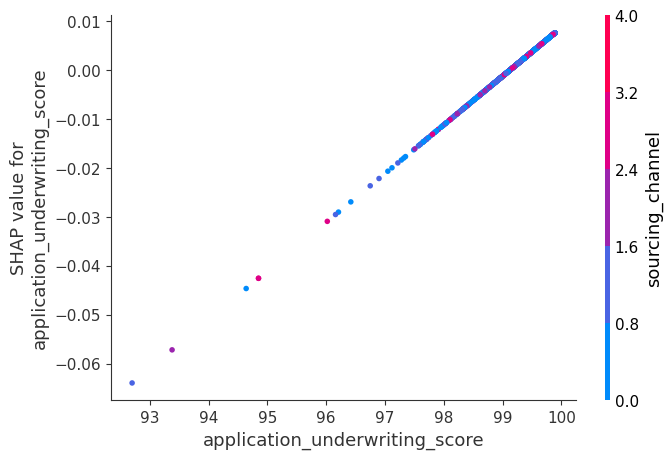

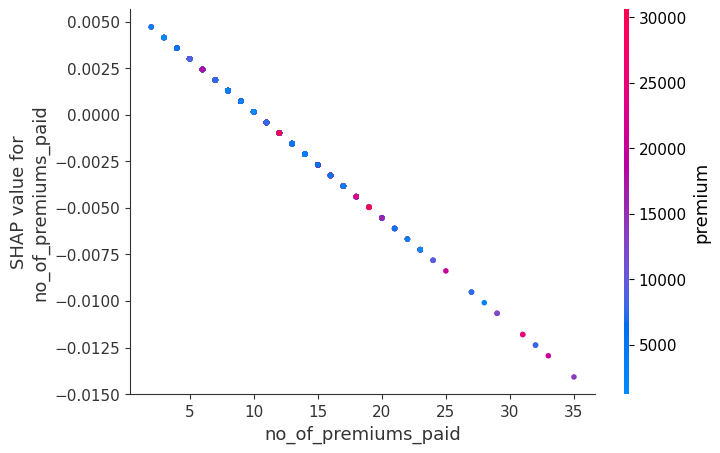

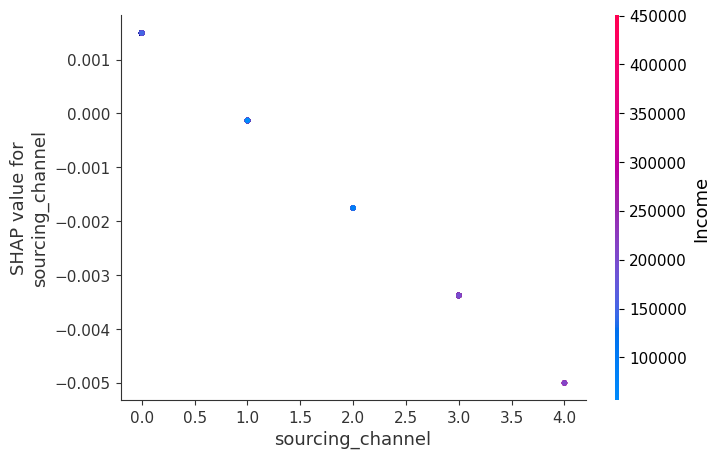

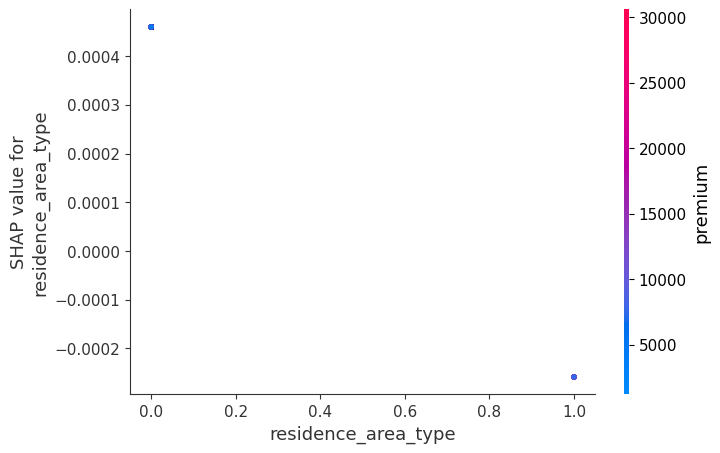

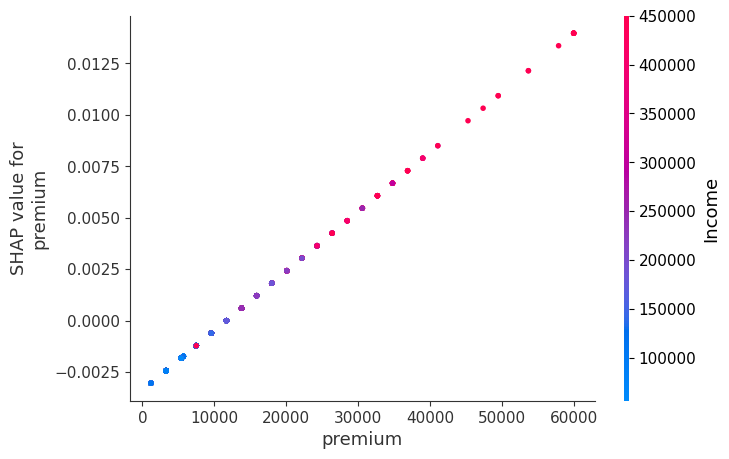

In [133]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train_1000)

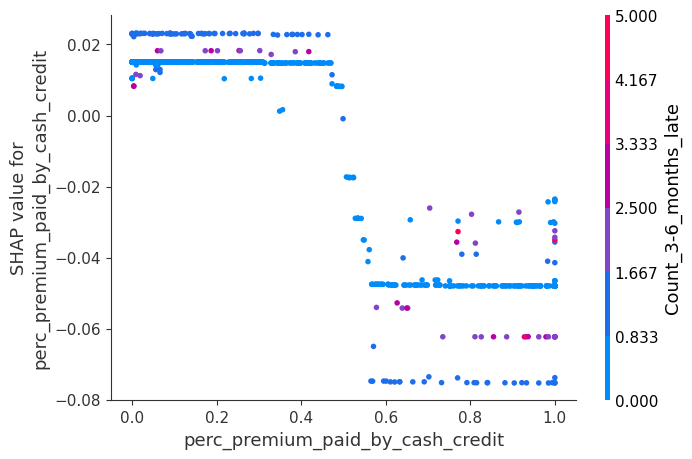

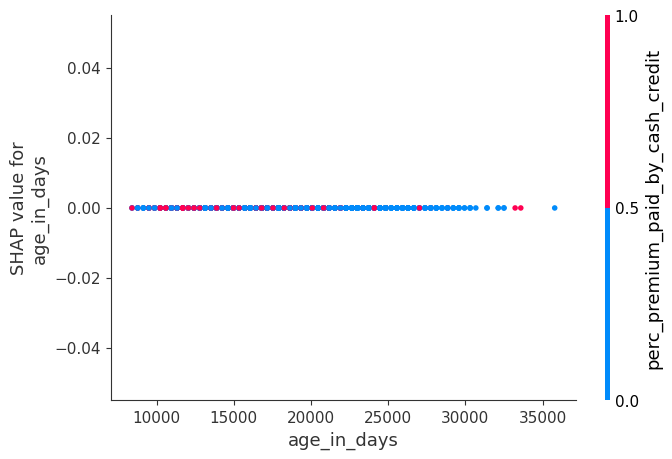

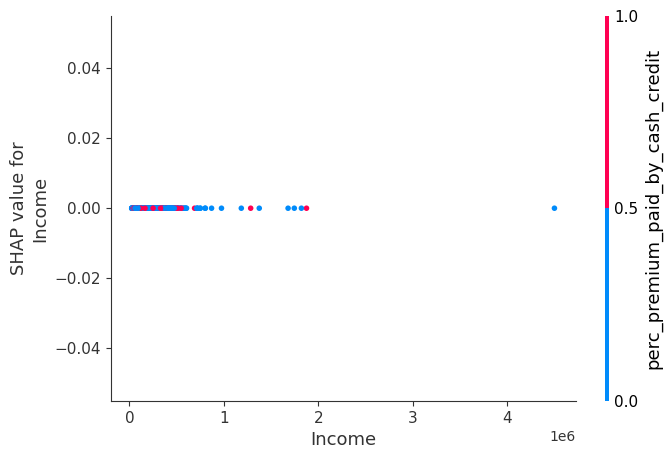

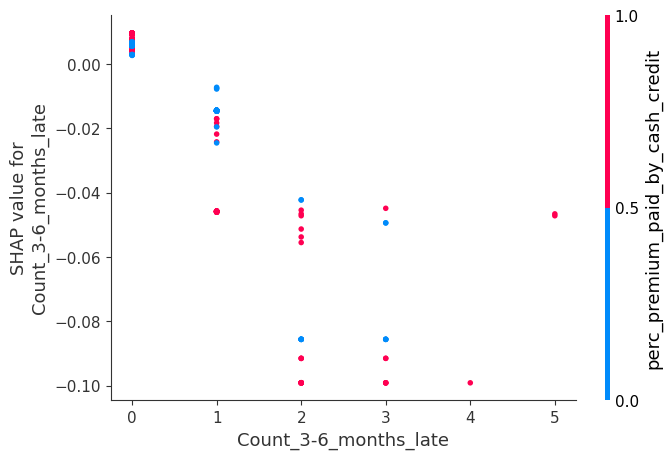

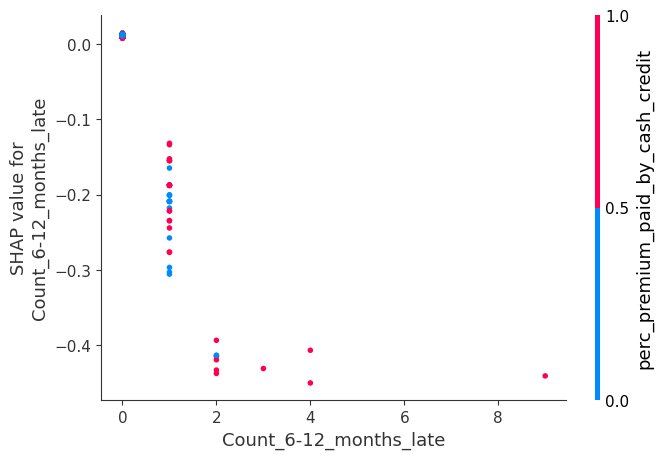

...

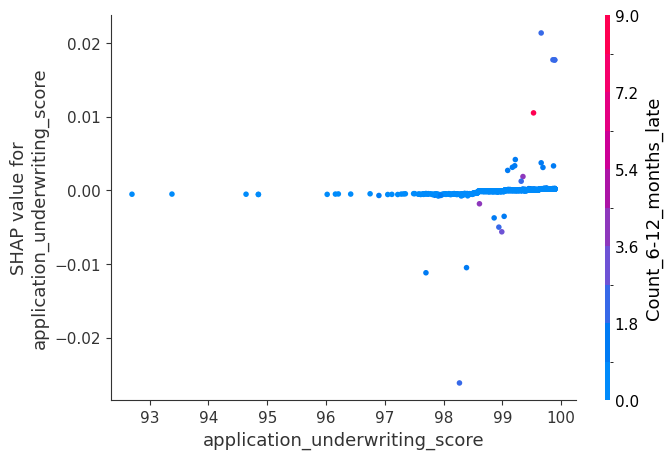

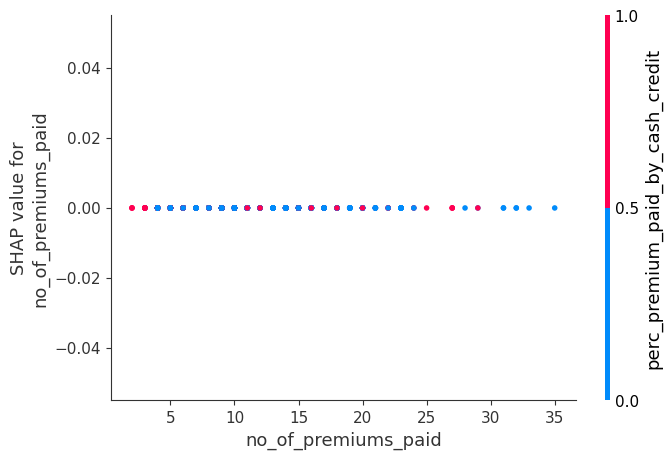

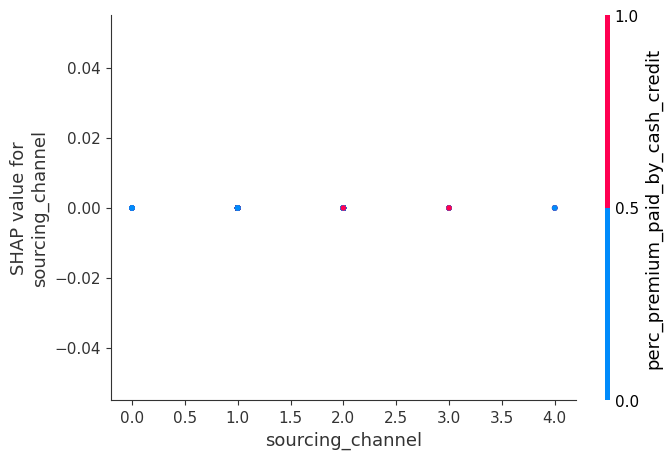

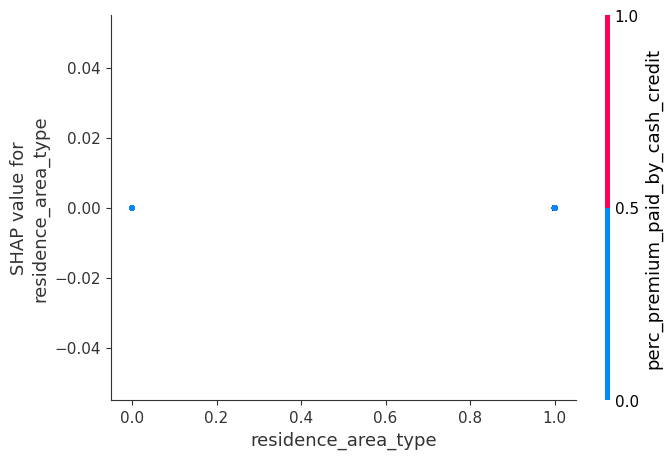

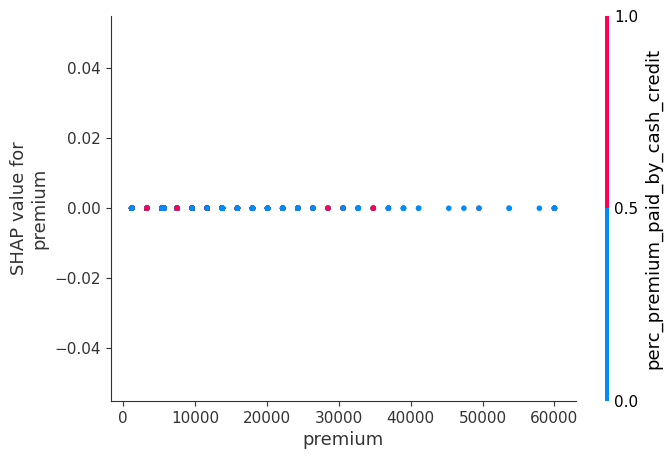

In [134]:
# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train_1000)

In [135]:
# Attaching the output of linear model to test dataframe
X_output_linear = x_test.copy()
X_output_linear.loc[:, "predict"] = np.round(linear_model.predict(X_output_linear), 2)  

# Attaching the output of tree based model to test dataframe
X_output_tree = x_test.copy()
X_output_tree.loc[:, "predict"] = np.round(tree_model.predict(X_output_tree), 2) 

In [136]:
# Force Plot of Tree Based Model
explainerModel = shap.TreeExplainer(tree_model)
shap_values_Model = explainerModel.shap_values(X_output_tree)


def shap_plot_tree(j):
    p = shap.force_plot(
        explainerModel.expected_value, shap_values_Model[j], X_output_tree.iloc[[j]]
    )
    return p

# Force Plot SHAP analysis
A Force Plot is a type of SHAP (SHapley Additive exPlanations) analysis that shows the impact of each feature on a specific prediction in a machine learning model. It displays the contribution of each feature to the prediction and the direction of its impact (positive or negative). The plot typically starts with a baseline prediction and shows how each feature value contributes to the final prediction, with arrows indicating the direction and magnitude of the impact. Force Plots are useful for understanding the reasoning behind individual predictions and can help diagnose model errors or biases.

In [137]:
# Initializing JavaScript module
shap.initjs()
# SHAP force plot for sample 18  
print(shap_plot_tree(18))  

# Heatmap Visualization for Linear and Tree-based model

The visualization under discussion is a concise representation of the impact of each data point in every feature on the target variable, which in this case is the quality of wine. The Y-axis represents the features of the dataset, while the X-axis displays the instances of each feature. The color of the instance on the heatmap represents whether it has a positive or negative effect on the target variable. A red instance indicates a positive effect, while a blue instance indicates a negative effect. Furthermore, the intensity of the color is proportional to the intensity of the effect, with deeper colors indicating more significant impacts. Thus, this visualization provides a quick and easy way to analyze the impact of individual features on the target variable in the dataset.

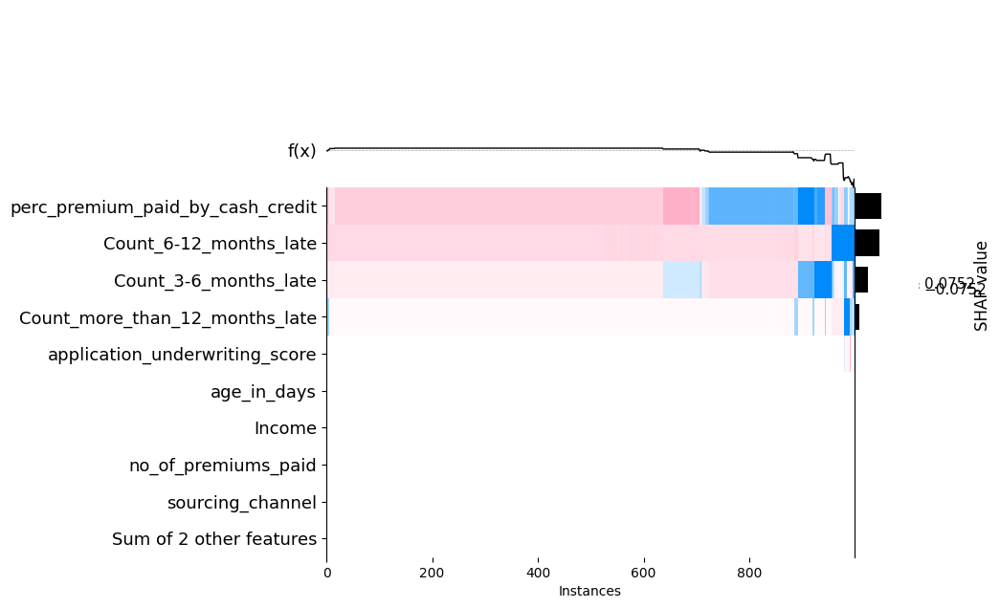

In [138]:
shap.plots.heatmap(tree_shap_values)  # SHAP HeatMap of a Tree Based Model

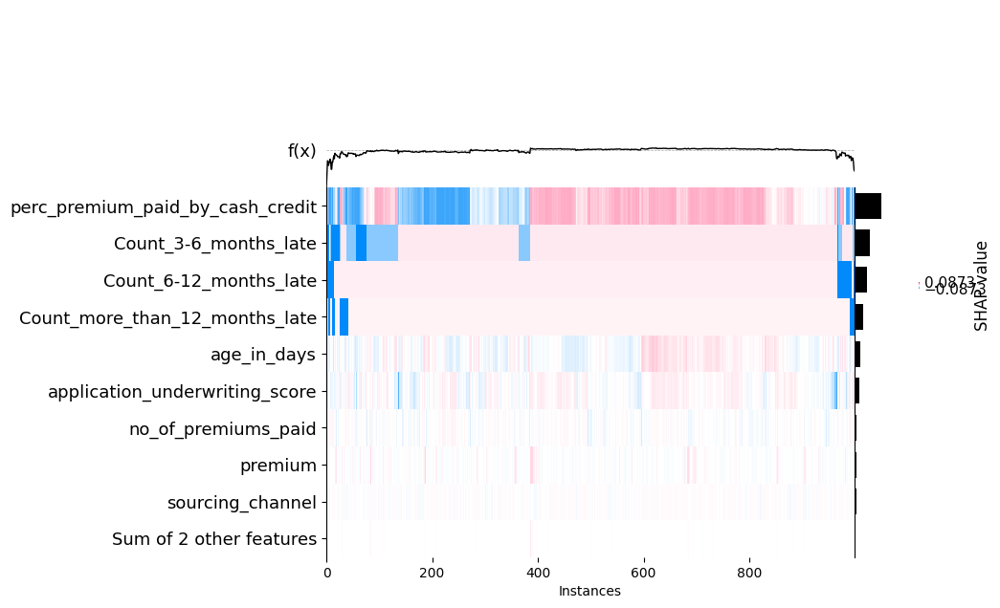

In [139]:
shap.plots.heatmap(linear_shap_values)  # SHAP heatmap for a Linear Model

## LIME (Local Interpretation Model-Agnostic Explanation) Analysis

LIME is a method for explaining the predictions made by complex machine learning models. It accomplishes this by building a simpler, interpretable model that approximates the behavior of the original model around a specific data point of interest. This simpler model can be a linear regression or decision tree, for instance, that captures the behavior of the original model in the local neighborhood of the data point being analyzed.

## Linear Model

In [140]:
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [141]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [0.98978094]
Actual :      1


In [142]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook

## Tree Based Model

In [143]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [144]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", tree_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], tree_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

Prediction :  [0.97820034]
Actual :      1


In [145]:
lime_tree_explanation.show_in_notebook()  # Display Results in Notebook

# Conclusion

SHAP uses a different approach than LIME for feature importance calculation. While LIME builds a local interpretable model, SHAP calculates the contribution of each feature to the prediction using the black-box model and then uses the Shapley values from game theory to determine feature importance. This results in greater stability and avoids assumptions of local linear models. It is important to consider our requirements and evaluate the trade-offs before selecting an interpretable method for our machine learning model.


# License 

MIT License

Copyright (c) 2023 Charmi Parmar

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

# References

* Scikit-learn official documentation: https://scikit-learn.org/stable/modules/preprocessing.html
* Shap official documentation: https://shap.readthedocs.io/en/latest/index.html
* Molnar, C. (2022). Interpretable Machine Learning: A Guide for Making Black Box Models Explainable (2nd ed.) 
christophm.github.io/interpretable-ml-book/
* https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d
* https://medium.com/@kalia_65609/interpreting-an-nlp-model-with-lime-and-shap-834ccfa124e4#:~:text=Unlike%20LIME%2C%20SHAP%20does%20not,to%20calculate%20the%20feature%20importance.
* https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/SHAP%20and%20LIME%20analysis%20Walkthrough.ipynb 


